<img align="left" src = https://project.lsst.org/sites/default/files/Rubin-O-Logo_0.png width=250 style="padding: 10px"> 
<br>
<b>HSC Cosmos Analysis Notebook</b> <br>
Contact author: Erin Howard<br>
Last verified to run: March 2, 2023<br>
LSST Science Piplines version: w_2023_04<br>
Container Size: Large <br>

# DM-37695: ApPipeWithFakes on HSC COSMOS, February 2023

## Current Run details

New baseline run.

* Templates are in `u/mrawls/DM-34711/templates`
* Final processing of HSC COSMOS is in `u/elhoward/DM-37695/HSC-fakes`
* Postgres schema is `elhoward_dm37695_hsc_appipewithfakes`
* Working directory on USDF with bps logs, pipelines, etc. is `/sdf/group/rubin/user/elhoward/repo-main-logs/DM-37695`

For ApPipeWithFakes.yaml:
```
inCollection: u/mrawls/DM-34711/templates,HSC/raw/RC2/9813,HSC/calib,HSC/masks,refcats,skymaps
dataQuery: "instrument='HSC' AND skymap='hsc_rings_v1' AND band IN ('g', 'r', 'i', 'z', 'y')"
```

## Previous Runs
- [DM-37206: ApPipeWithFakes on HSC COSMOS with Preconvolution, January 2023](./DM-37206-AP-HSC-With-Fakes-Jan2023.ipynb)
- [DM-35285: ApPipeWithFakes on HSC COSMOS, November 2022](./DM-35285-AP-HSC-With-Fakes-Nov2022.ipynb)

## Table of Contents

1. [Loading DiaObjects and DiaSources](#section_1)
2. [DiaObject and DiaSources analysis](#section_2)
3. [Comparisons to previous processing run](#section_3)]
4. [Separating the fake sources from the real sources](#section_4)
5. [Fakes completeness analysis](#section_5)
6. [Calexp and PSF analysis](#section_6)
7. [SNR distributions](#section_7)

In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
import importlib
import pandas as pd
import astropy.units as u
import lsst.afw.display as afwDisplay
import lsst.geom

import lsst.daf.butler as dafButler
from lsst.analysis.ap import legacyApdbUtils as utils
from lsst.analysis.ap import legacyPlotUtils as plac

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

importlib.reload(utils)

<module 'lsst.analysis.ap.legacyApdbUtils' from '/sdf/data/rubin/u/elhoward/repos/analysis_ap/python/lsst/analysis/ap/legacyApdbUtils.py'>

## 1. <a id="section_1">Loading DiaObjects and DiaSources</a>

In [2]:
repo = '/repo/main'
butler = dafButler.Butler(repo)
instrument = 'HSC'
skymap = 'hsc_rings_v1'

dbType='postgres'
dbName='lsst-devl'

fakeStatus = 'with fakes'

dmnum = '37695'
collections = f'u/elhoward/DM-{dmnum}/HSC-fakes'
schema = f'elhoward_dm{dmnum}_hsc_appipewithfakes'
month = 'February'
year = '2023'

dmnum_old = '35285'
collections_old = f'u/elhoward/DM-{dmnum_old}/hsc-output-collection'
schema_old = f'elhoward_dm{dmnum_old}_hsc_appipewithfakes'
month_old = 'November'
year_old = '2022'

collectionsList = [collections,collections_old]

In [3]:
objTable, srcTable, goodObj, goodSrc = utils.loadTables(repo,
                                                        dbName=dbName,
                                                        dbType=dbType,
                                                        instrument=instrument,
                                                        schema=schema)

In [4]:
flagTable, srcTableFlags, flagFilter, goodSrc, goodObj = utils.makeSrcTableFlags(srcTable, objTable,
                                                                                 instrument=instrument,
                                                                                 repo=repo)

In [5]:
objTable_old, srcTable_old, goodObj_old, goodSrc_old = utils.loadTables(repo,
                                                                        dbName=dbName,
                                                                        dbType=dbType,
                                                                        instrument=instrument,
                                                                        schema=schema_old)

In [6]:
flagTable_old, srcTableFlags_old, flagFilter_old, goodSrc_old, goodObj_old = utils.makeSrcTableFlags(srcTable_old, objTable_old,
                                                                                                     instrument=instrument,
                                                                                                     repo=repo)

## 2. <a id="section_2">DIA object and source visual analysis</a>

Plots look reasonable and are consistent with previous base run.

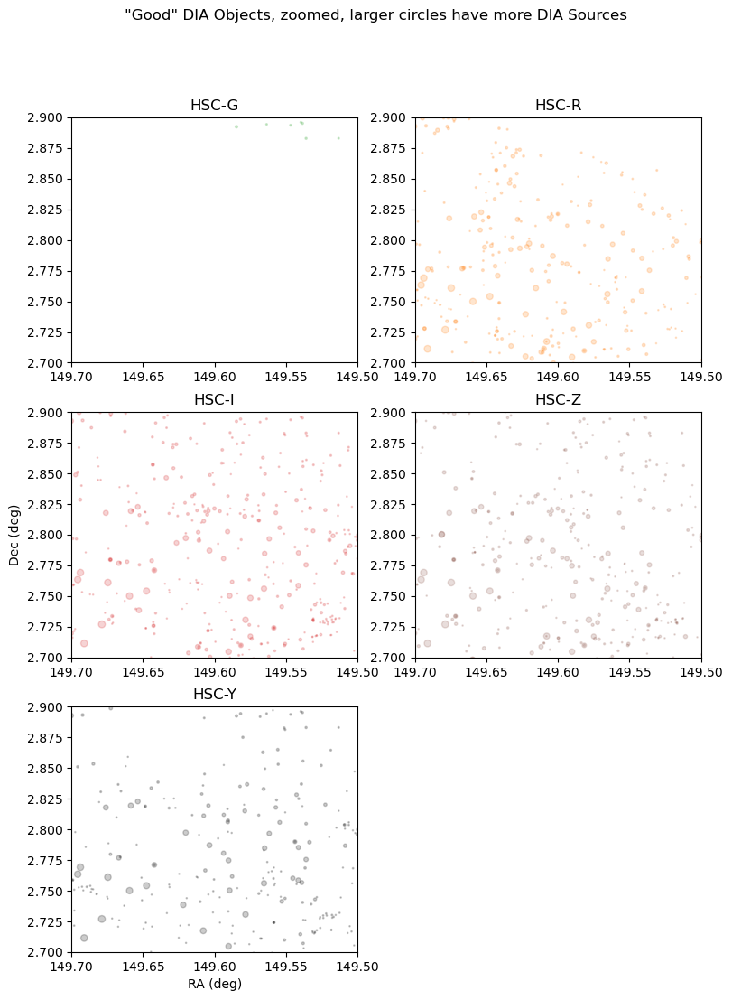

In [7]:
fig, axs = plt.subplots(3, 2, figsize=(9, 12))

fig.suptitle('"Good" DIA Objects, zoomed, larger circles have more DIA Sources')

nSrc = 2  # threshold for which DIA Objects to plot (only those with > nSrc constituent DIA Sources)

axG = axs[0, 0]
axR = axs[0, 1]
axI = axs[1, 0]
axZ = axs[1, 1]
axY = axs[2, 0]

ax0 = axs[2, 1]
ax0.axis('off')

axList = [axG, axR, axI, axZ, axY]

xlim = [149.7, 149.5]
ylim = [2.7, 2.9]
plt.setp(axs, xlim=xlim, ylim=ylim)

goodGFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['gPSFluxMean'] > 0)
goodRFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['rPSFluxMean'] > 0)
goodIFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['iPSFluxMean'] > 0)
goodZFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['zPSFluxMean'] > 0)
goodYFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['yPSFluxMean'] > 0)

goodFilterList = [goodGFilter, goodRFilter, goodIFilter, goodZFilter, goodYFilter]

axY.set_xlabel('RA (deg)')
axI.set_ylabel('Dec (deg)')

axG.set_title('HSC-G')
axR.set_title('HSC-R')
axI.set_title('HSC-I')
axZ.set_title('HSC-Z')
axY.set_title('HSC-Y')

colorList = ['C2', 'C1', 'C3', 'C5', 'k']

for ax, goodFilter, color in zip(axList, goodFilterList, colorList):
    ax.scatter(goodObj.loc[goodFilter, 'ra'],
               goodObj.loc[goodFilter, 'decl'],
               s=goodObj.loc[goodFilter, 'nDiaSources'], c=color, marker='.', alpha=0.2)

Text(0.5, 1.0, 'HSC-Y')

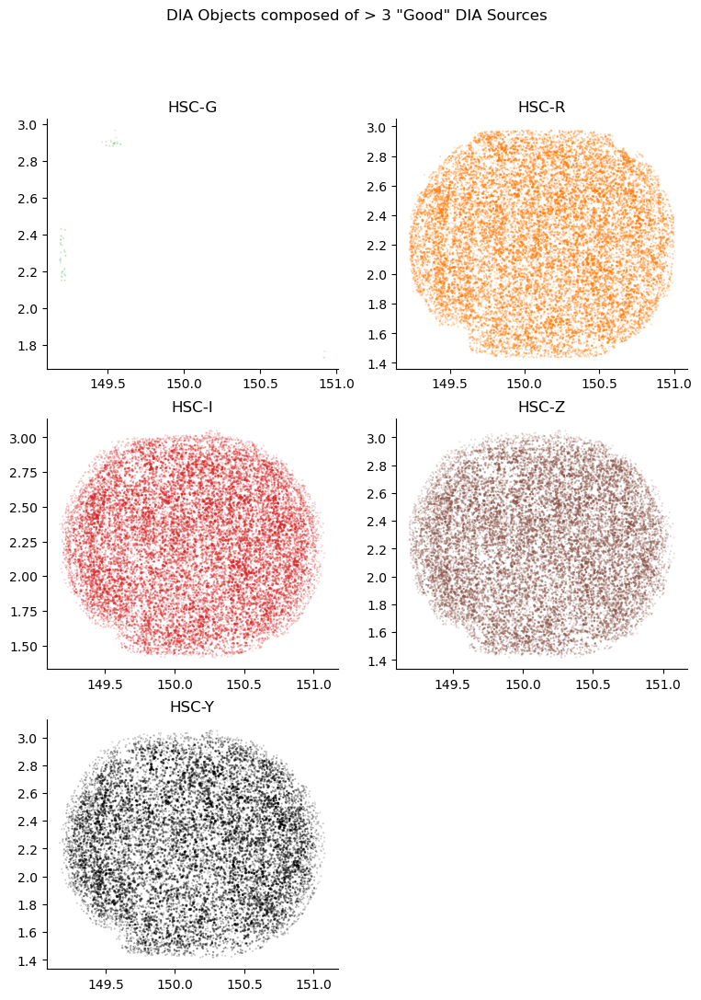

In [8]:
cutoff = 0  # only plot DIA Objects composed of cutoff or more DIA Sources

fig, axs = plt.subplots(3, 2, figsize=(9, 12))

axG = axs[0, 0]
axR = axs[0, 1]
axI = axs[1, 0]
axZ = axs[1, 1]
axY = axs[2, 0]
#axHits = axs[2, 1]

ax0 = axs[2, 1]
ax0.axis('off')

axList = [axG, axR, axI, axZ, axY]
colorList = ['C2', 'C1', 'C3', 'C5', 'k']

### DIA OBJECTS ###

nSrc = 3  # threshold for which DIA Objects to plot (only those with > nSrc constituent DIA Sources)
fig.suptitle(f'DIA Objects composed of > {nSrc} "Good" DIA Sources')

goodGFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['gPSFluxMean'] > 0)
goodRFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['rPSFluxMean'] > 0)
goodIFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['iPSFluxMean'] > 0)
goodZFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['zPSFluxMean'] > 0)
goodYFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['yPSFluxMean'] > 0)

filterList = [goodGFilter, goodRFilter, goodIFilter, goodZFilter, goodYFilter]

for ax, filtered, color in zip(axList, filterList, colorList):
    ax.scatter(goodObj.loc[filtered, 'ra'], goodObj.loc[filtered, 'decl'], c=color, marker='.', alpha=0.4,
               s=goodObj.loc[(goodObj['nDiaSources'] > cutoff) & (filtered), 'nDiaSources']/20)

for ax in axList:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

axG.set_title('HSC-G')
axR.set_title('HSC-R')
axI.set_title('HSC-I')
axZ.set_title('HSC-Z')
axY.set_title('HSC-Y')

Text(0.5, 1.0, 'HSC-Y')

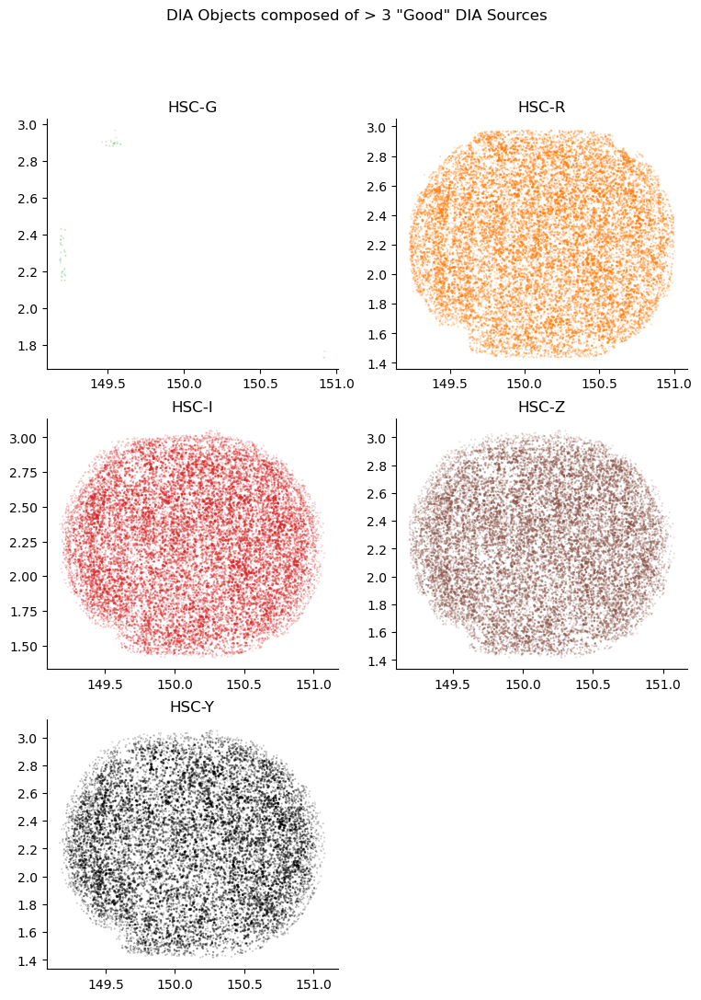

In [9]:
cutoff = 3  # only plot DIA Objects composed of cutoff or more DIA Sources

fig, axs = plt.subplots(3, 2, figsize=(9, 12))

axG = axs[0, 0]
axR = axs[0, 1]
axI = axs[1, 0]
axZ = axs[1, 1]
axY = axs[2, 0]
#axHits = axs[2, 1]

ax0 = axs[2, 1]
ax0.axis('off')

axList = [axG, axR, axI, axZ, axY]
colorList = ['C2', 'C1', 'C3', 'C5', 'k']

### DIA OBJECTS ###

nSrc = 3  # threshold for which DIA Objects to plot (only those with > nSrc constituent DIA Sources)
fig.suptitle(f'DIA Objects composed of > {nSrc} "Good" DIA Sources')

goodGFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['gPSFluxMean'] > 0)
goodRFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['rPSFluxMean'] > 0)
goodIFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['iPSFluxMean'] > 0)
goodZFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['zPSFluxMean'] > 0)
goodYFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj['yPSFluxMean'] > 0)

filterList = [goodGFilter, goodRFilter, goodIFilter, goodZFilter, goodYFilter]

for ax, filtered, color in zip(axList, filterList, colorList):
    ax.scatter(goodObj.loc[filtered, 'ra'], goodObj.loc[filtered, 'decl'], c=color, marker='.', alpha=0.4,
               s=goodObj.loc[(goodObj['nDiaSources'] > cutoff) & (filtered), 'nDiaSources']/20)

for ax in axList:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

axG.set_title('HSC-G')
axR.set_title('HSC-R')
axI.set_title('HSC-I')
axZ.set_title('HSC-Z')
axY.set_title('HSC-Y')

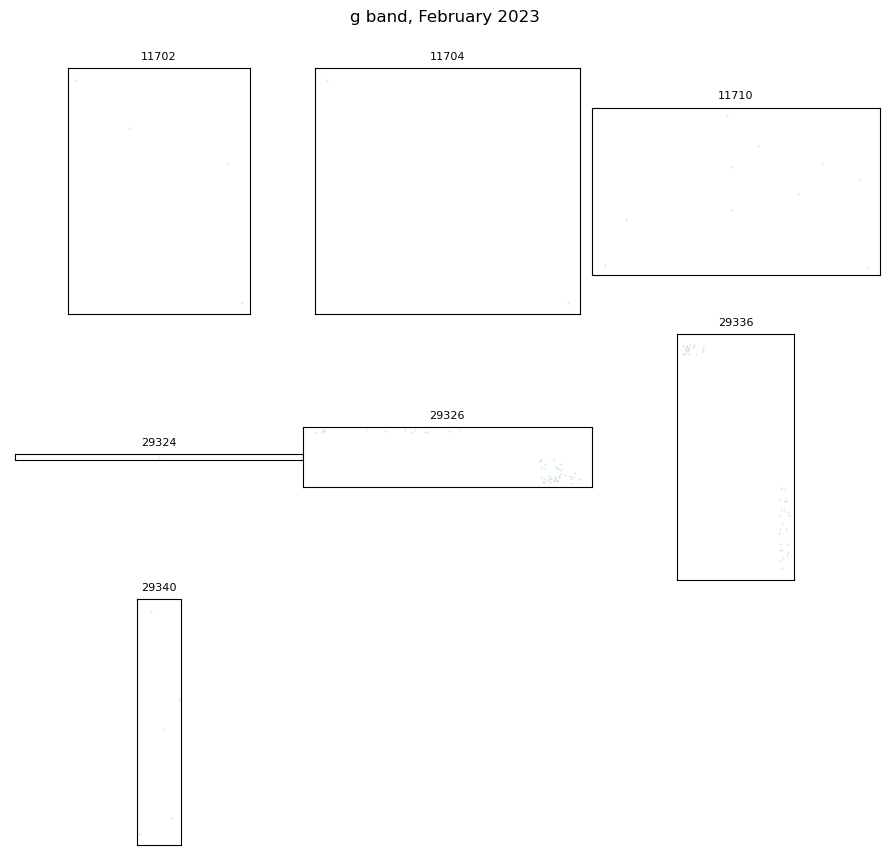

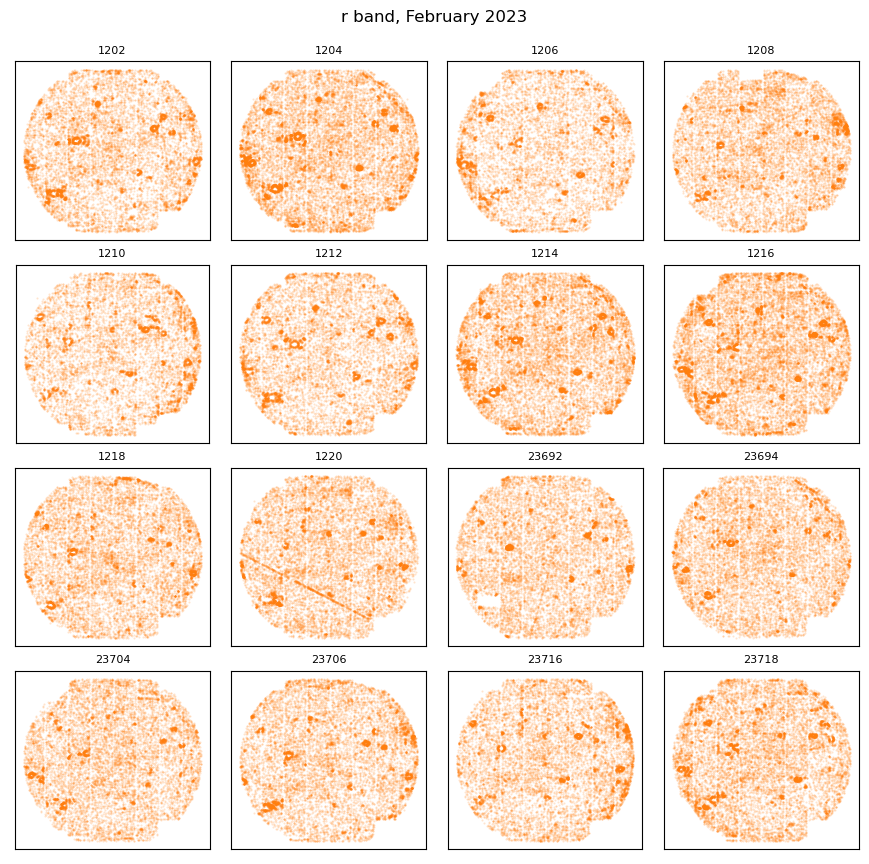

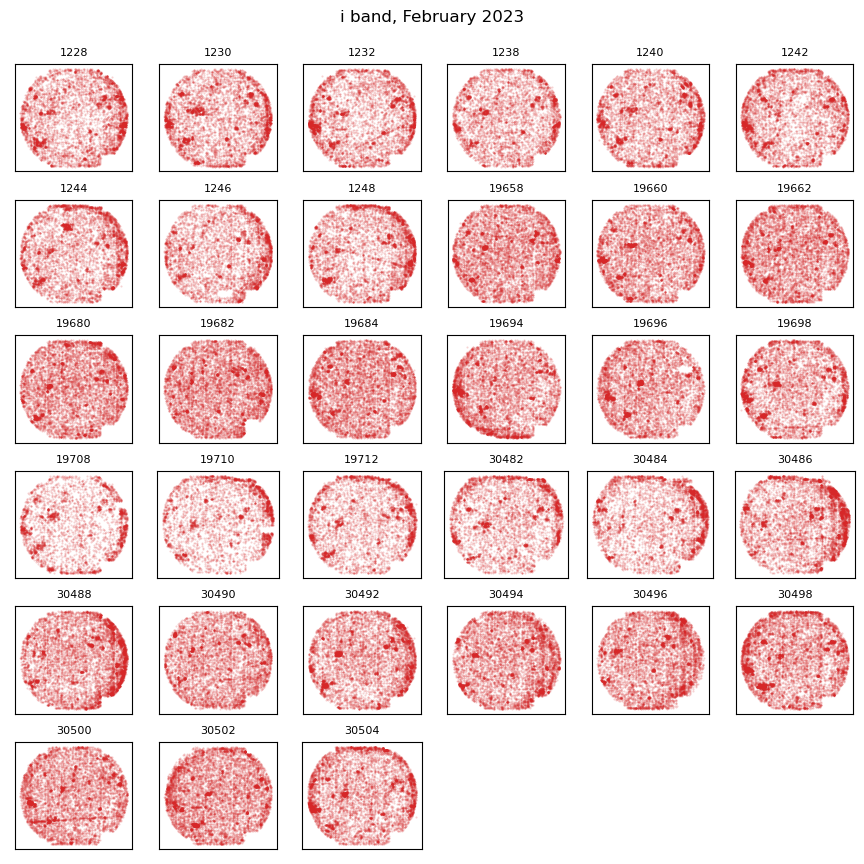

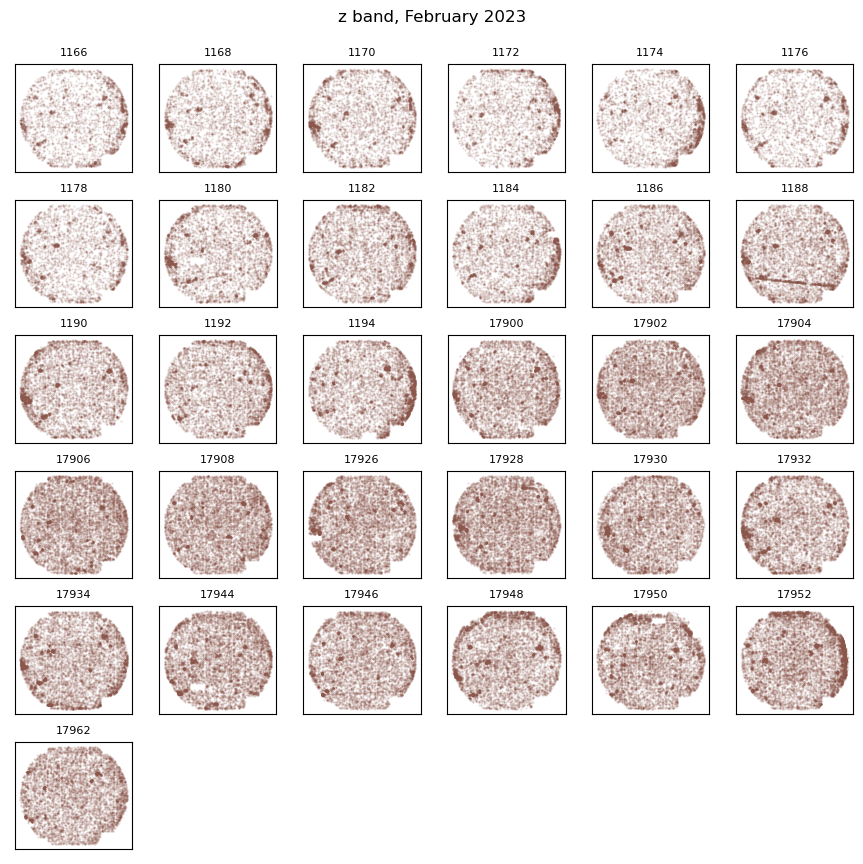

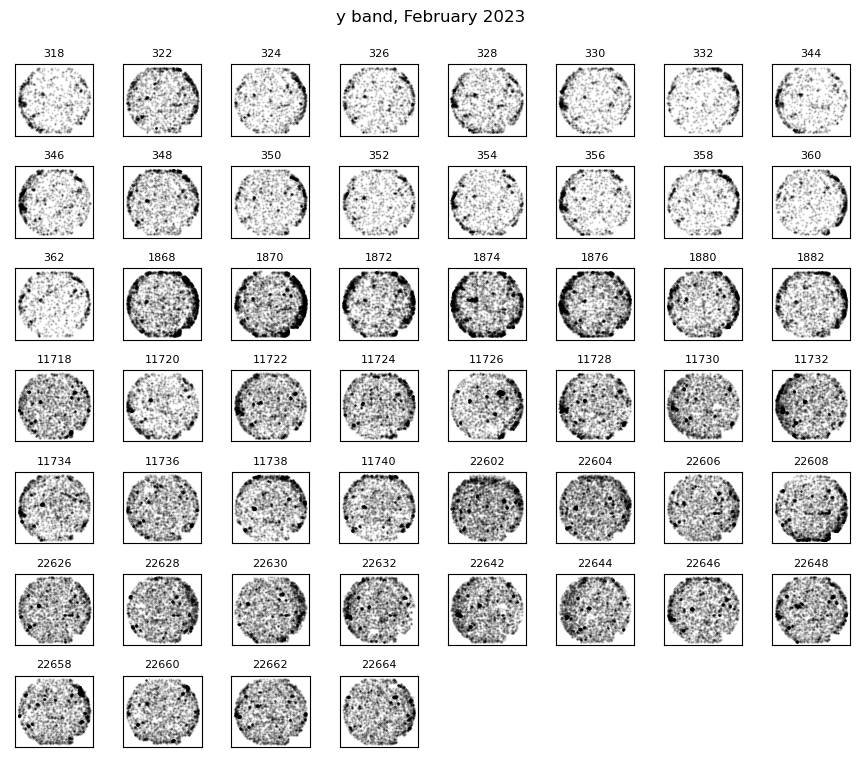

In [10]:
# Note: g band data per visit is sparse
bandList = ['g', 'r', 'i', 'z', 'y']
colorList = ['C2', 'C1', 'C3', 'C5', 'k']
size=1

for band, color in zip(bandList, colorList):
    plac.plotDiaSourcesOnSkyGrid(repo, goodSrc.loc[goodSrc['filterName'] == band], title=band+f' band, {month} {year}', color=color, size=size)

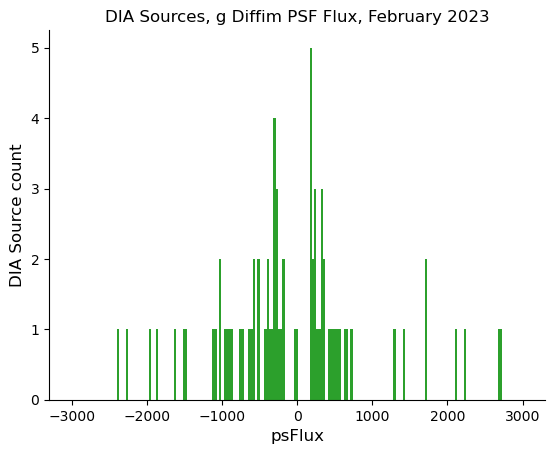

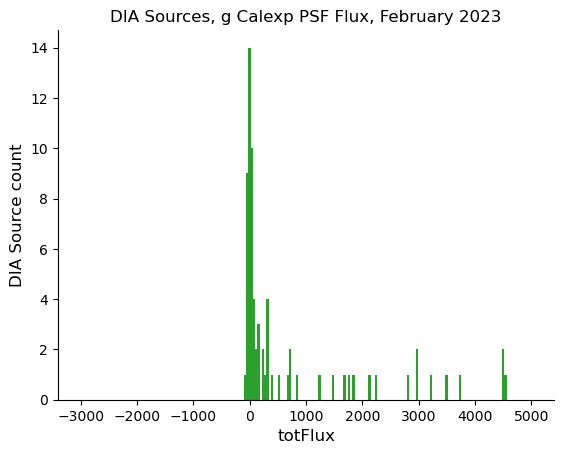

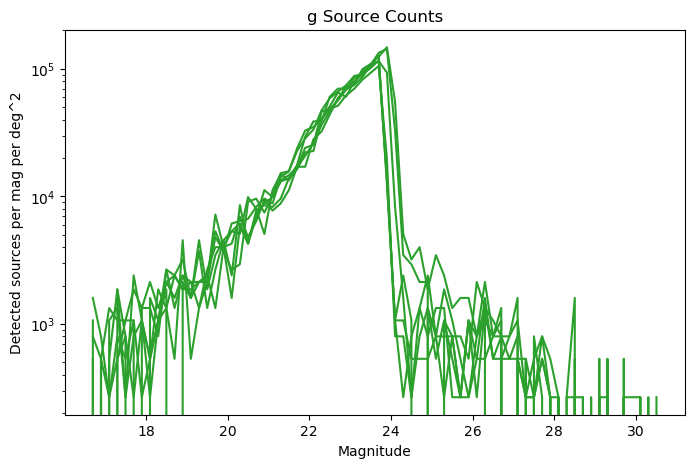

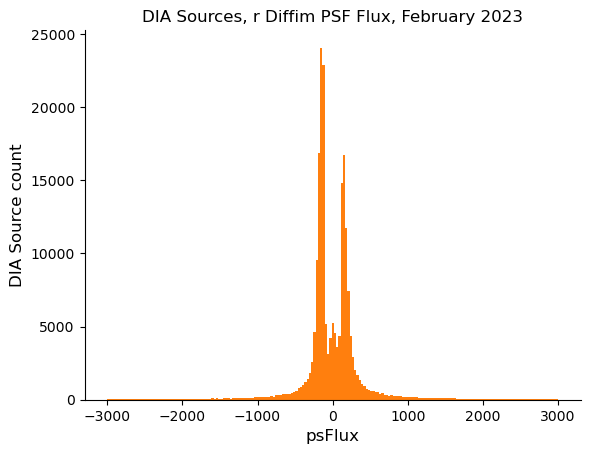

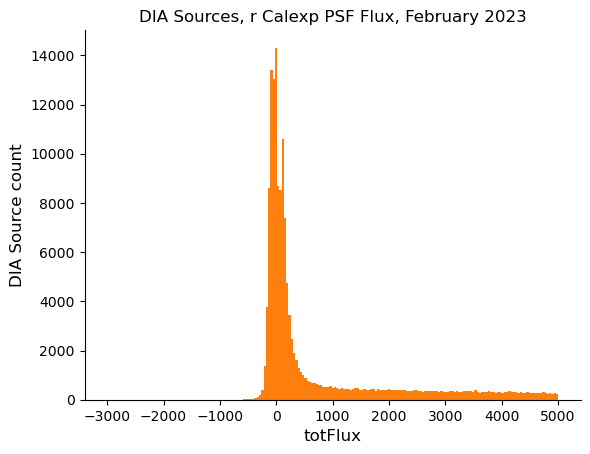

...

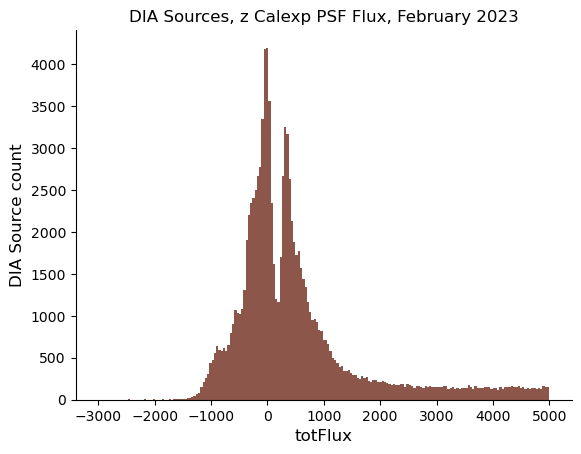

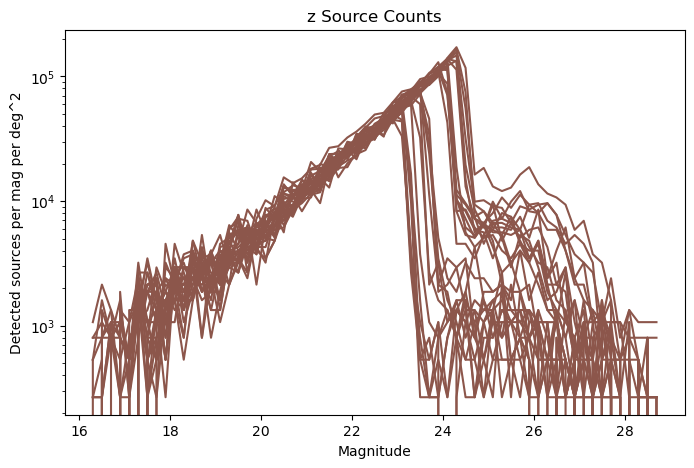

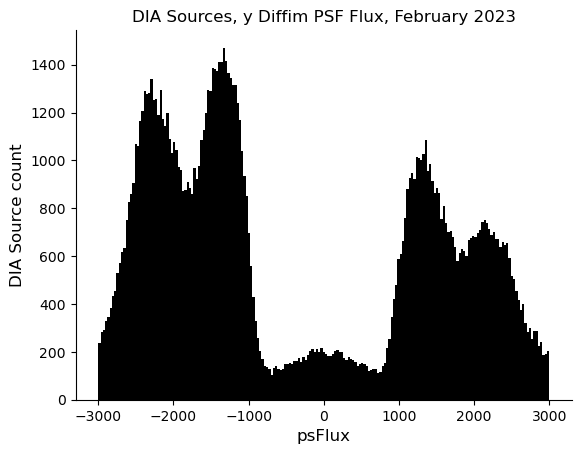

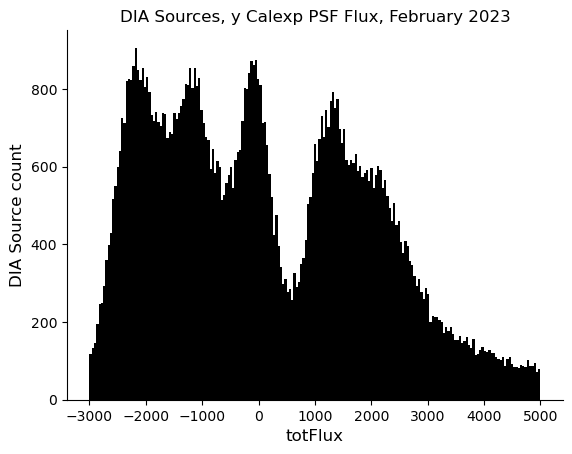

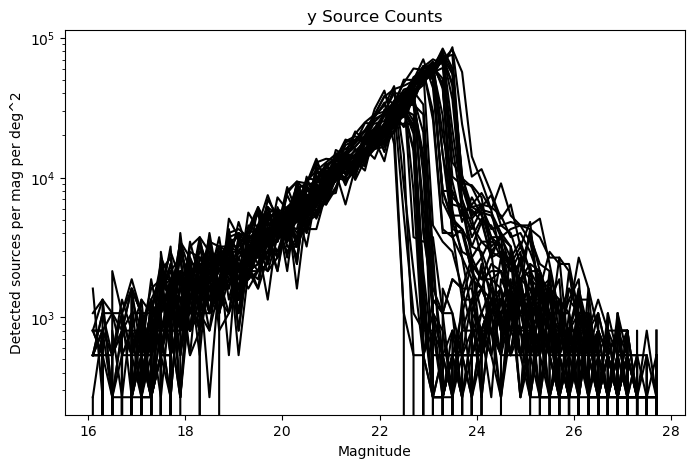

In [11]:
collection = collections

for band, color in zip(bandList, colorList):
    plac.plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == band], fluxType='psFlux',
                        title=f'DIA Sources, {band} Diffim PSF Flux, {month} {year}', color1=color, binmin=-3e3, binmax=3e3)
    plac.plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == band], fluxType='totFlux',
                        title=f'DIA Sources, {band} Calexp PSF Flux, {month} {year}', color1=color, binmin=-3e3, binmax=5e3)
    plac.source_magnitude_histogram(repo, goodSrc, band, 'HSC', collection)

## 3. <a id="section_3">Comparison to previous processing run</a>

No significant changes. Flags are consistent. Slight decrease in DIA sources, with most of them being good DIA sources.

Text(0.5, 1.0, 'DIA Object and DIA Source counts')

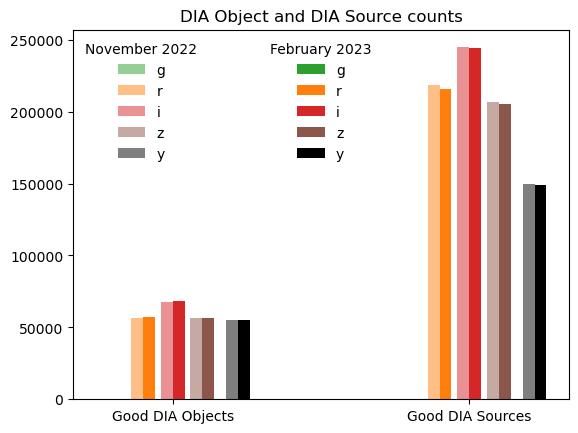

In [12]:
label1 = f'{month_old} {year_old}'
label2 = f'{month} {year}'

fig, ax = plt.subplots()
barLabels = ['Good DIA Objects', 'Good DIA Sources']
xbar = np.array([0, 1])
width = 0.2

# Previous Run
goodObjG_old = goodObj_old.loc[goodObj_old['gPSFluxMean'] > 0]
goodObjR_old = goodObj_old.loc[goodObj_old['rPSFluxMean'] > 0]
goodObjI_old = goodObj_old.loc[goodObj_old['iPSFluxMean'] > 0]
goodObjZ_old = goodObj_old.loc[goodObj_old['zPSFluxMean'] > 0]
goodObjY_old = goodObj_old.loc[goodObj_old['yPSFluxMean'] > 0]

goodSrcG_old = goodSrc_old.loc[goodSrc_old['filterName'] == 'g']
goodSrcR_old = goodSrc_old.loc[goodSrc_old['filterName'] == 'r']
goodSrcI_old = goodSrc_old.loc[goodSrc_old['filterName'] == 'i']
goodSrcZ_old = goodSrc_old.loc[goodSrc_old['filterName'] == 'z']
goodSrcY_old = goodSrc_old.loc[goodSrc_old['filterName'] == 'y']

g_old = ax.bar(xbar - (6/5) * width, [len(goodObjG_old), len(goodSrcG_old)], width/5, label='g', color='C2', alpha=0.5)
r_old = ax.bar(xbar - (3/5) * width, [len(goodObjR_old), len(goodSrcR_old)], width/5, label='r', color='C1', alpha=0.5)
i_old = ax.bar(xbar - (1/10) * width, [len(goodObjI_old), len(goodSrcI_old)], width/5, label='i', color='C3', alpha=0.5)
z_old = ax.bar(xbar + (2/5) * width, [len(goodObjZ_old), len(goodSrcZ_old)], width/5, label='z', color='C5', alpha=0.5)
y_old = ax.bar(xbar + width, [len(goodObjY_old), len(goodSrcY_old)], width/5, label='y', color='k', alpha=0.5)

# Current 
goodObjG = goodObj.loc[goodObj['gPSFluxMean'] > 0]
goodObjR = goodObj.loc[goodObj['rPSFluxMean'] > 0]
goodObjI = goodObj.loc[goodObj['iPSFluxMean'] > 0]
goodObjZ = goodObj.loc[goodObj['zPSFluxMean'] > 0]
goodObjY = goodObj.loc[goodObj['yPSFluxMean'] > 0]

goodSrcG = goodSrc.loc[goodSrc['filterName'] == 'g']
goodSrcR = goodSrc.loc[goodSrc['filterName'] == 'r']
goodSrcI = goodSrc.loc[goodSrc['filterName'] == 'i']
goodSrcZ = goodSrc.loc[goodSrc['filterName'] == 'z']
goodSrcY = goodSrc.loc[goodSrc['filterName'] == 'y']

g = ax.bar(xbar - width, [len(goodObjG), len(goodSrcG)], width/5, label='g', color='C2')
r = ax.bar(xbar - (2/5) * width, [len(goodObjR), len(goodSrcR)], width/5, label='r', color='C1')
i = ax.bar(xbar + (1/10) * width, [len(goodObjI), len(goodSrcI)], width/5, label='i', color='C3')
z = ax.bar(xbar + (3/5) * width, [len(goodObjZ), len(goodSrcZ)], width/5, label='z', color='C5')
y = ax.bar(xbar + (6/5) * width, [len(goodObjY), len(goodSrcY)], width/5, label='y', color='k')

ax.set_xticks([0, 1])
labels = ax.set_xticklabels(barLabels)
previous_legend = plt.legend(handles=[g_old, r_old, i_old, z_old,  y_old], loc='upper left', frameon=False, title=label1)
ax = plt.gca().add_artist(previous_legend)
current_legend = plt.legend(handles=[g, r, i, z,  y], loc='upper center', frameon=False, title=label2)
plt.title(f'DIA Object and DIA Source counts')

Text(0.5, 1.0, 'Comparing DIA Object and Source counts (with fakes)')

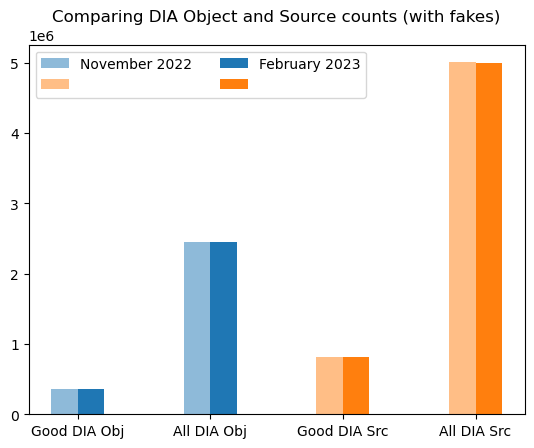

In [13]:
label1 = f'{month_old} {year_old}'
label2 = f'{month} {year}'

fig, ax = plt.subplots()
barLabels = ['Good DIA Obj', 'All DIA Obj', 'Good DIA Src', 'All DIA Src']
xbar = np.array([0, 1])
width = 0.2

# Previous Run
ax.bar(xbar - width/2, [len(goodObj_old), len(objTable_old)], 
       width, label=label1, color='C0', alpha=0.5)
ax.bar(xbar + 2 - width/2, [len(goodSrc_old), len(srcTable_old)],
       width, label=' ', color='C1', alpha=0.5)

# Current Run
ax.bar(xbar + width/2, [len(goodObj), len(objTable)], 
       width, label=label2, color='C0')
ax.bar(xbar + 2 + width/2, [len(goodSrc), len(srcTable)],
       width, label=' ', color='C1')

plt.legend(ncol=2)
ax.set_xticks([0, 1, 2, 3])
labels = ax.set_xticklabels(barLabels)
plt.title(f'Comparing DIA Object and Source counts ({fakeStatus})')

In [14]:
nGoodObj = len(goodObj)
nGoodObj_old = len(goodObj_old)

print(f"{month} {year}, Number of good objects: ",nGoodObj)
print(f"{month_old} {year_old}, Number of good objects: ",nGoodObj_old)

print("Diff: ", nGoodObj-nGoodObj_old)

February 2023, Number of good objects:  363523
November 2022, Number of good objects:  364376
Diff:  -853


In [15]:
nObj = len(objTable)
nObj_old = len(objTable_old)

print(f"{month} {year}, Number of objects: ",nObj)
print(f"{month_old} {year_old}, Number of objects: ",nObj_old)

print("Diff: ", nObj-nObj_old)

February 2023, Number of objects:  2451020
November 2022, Number of objects:  2450334
Diff:  686


In [16]:
nGoodSrc = len(goodSrc)
nGoodSrc_old = len(goodSrc_old)

print(f"{month} {year}, Number of good sources: ",nGoodSrc)
print(f"{month_old} {year_old}, Number of good sources: ",nGoodSrc_old)

print("Diff: ", nGoodSrc-nGoodSrc_old)

February 2023, Number of good sources:  814855
November 2022, Number of good sources:  819928
Diff:  -5073


In [17]:
nSrc = len(srcTable)
nSrc_old = len(srcTable_old)

print(f"{month} {year}, Number of sources: ",nSrc)
print(f"{month_old} {year_old}, Number of sources: ",nSrc_old)

print("Diff: ", nSrc-nSrc_old)

February 2023, Number of sources:  5002525
November 2022, Number of sources:  5007735
Diff:  -5210


In [18]:
xlim = (151.05, 149.40)
ylim = (1.45, 3.03)

Text(0.5, 0.98, 'All DIA Sources (with fakes)')

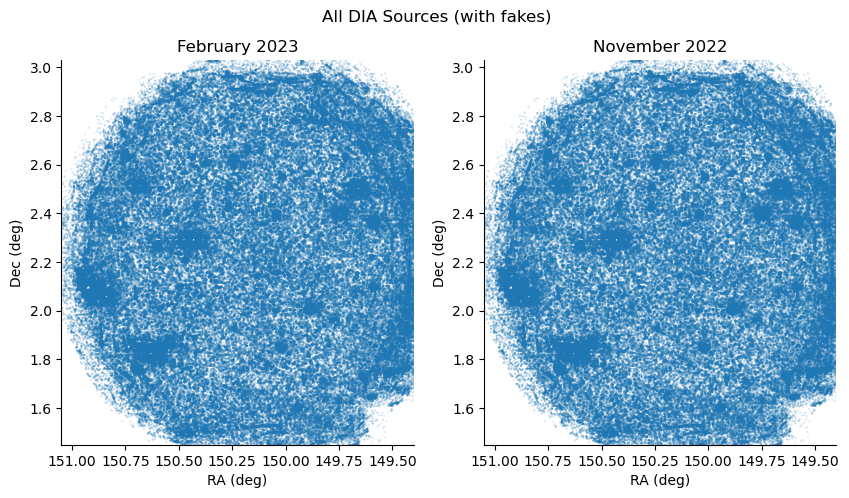

In [19]:
fig = plt.figure(figsize=(10,5))

cutoff = 0  # only plot DIA Objects composed of cutoff or more DIA Sources

ax = fig.add_subplot(121)
plt.setp(ax, xlim=xlim, ylim=ylim)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.scatter(goodObj.loc[goodObj['nDiaSources'] > cutoff, 'ra'], goodObj.loc[goodObj['nDiaSources'] > cutoff, 'decl'], 
           c='C0', s=goodObj.loc[goodObj['nDiaSources'] > cutoff, 'nDiaSources']/10, marker='.', alpha=0.4)
ax.set_xlabel('RA (deg)')
ax.set_ylabel('Dec (deg)')
ax.set_title(f'{month} {year}')

ax2 = fig.add_subplot(122)
plt.setp(ax2, xlim=xlim, ylim=ylim)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.scatter(goodObj_old.loc[goodObj_old['nDiaSources'] > cutoff, 'ra'], 
            goodObj_old.loc[goodObj_old['nDiaSources'] > cutoff, 'decl'], 
            c='C0', s=goodObj_old.loc[goodObj_old['nDiaSources'] > cutoff, 'nDiaSources']/10, 
            marker='.', alpha=0.4)
ax2.set_xlabel('RA (deg)')
ax2.set_ylabel('Dec (deg)')
ax2.set_title(f'{month_old} {year_old}')

plt.suptitle(f'All DIA Sources ({fakeStatus})')

Text(0.5, 0.98, 'DIA Objects composed of > 3 "Good" DIA Sources (with fakes)')

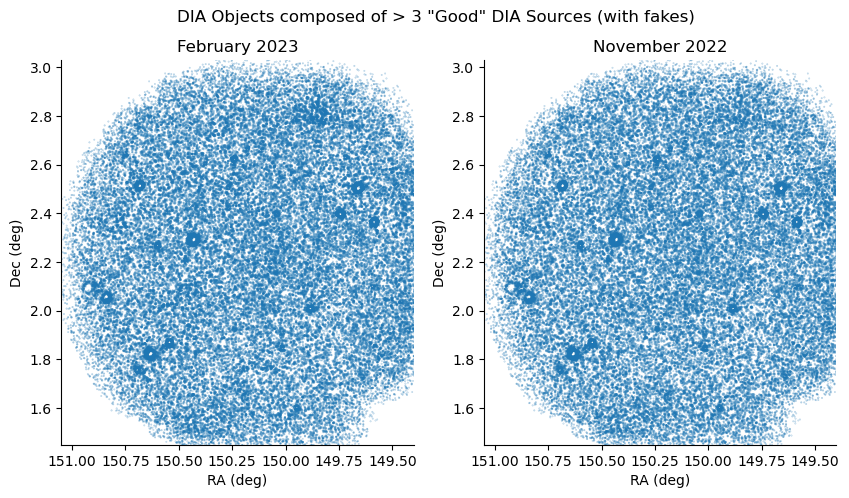

In [20]:
fig = plt.figure(figsize=(10,5))

cutoff = 3  # only plot DIA Objects composed of cutoff or more DIA Sources

ax = fig.add_subplot(121)
plt.setp(ax, xlim=xlim, ylim=ylim)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.scatter(goodObj.loc[goodObj['nDiaSources'] > cutoff, 'ra'], goodObj.loc[goodObj['nDiaSources'] > cutoff, 'decl'], 
           c='C0', s=goodObj.loc[goodObj['nDiaSources'] > cutoff, 'nDiaSources']/10, marker='.', alpha=0.4)
ax.set_xlabel('RA (deg)')
ax.set_ylabel('Dec (deg)')
ax.set_title(f'{month} {year}')

ax2 = fig.add_subplot(122)
plt.setp(ax2, xlim=xlim, ylim=ylim)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.scatter(goodObj_old.loc[goodObj_old['nDiaSources'] > cutoff, 'ra'], 
            goodObj_old.loc[goodObj_old['nDiaSources'] > cutoff, 'decl'], 
            c='C0', s=goodObj_old.loc[goodObj_old['nDiaSources'] > cutoff, 'nDiaSources']/10, 
            marker='.', alpha=0.4)
ax2.set_xlabel('RA (deg)')
ax2.set_ylabel('Dec (deg)')
ax2.set_title(f'{month_old} {year_old}')

plt.suptitle(f'DIA Objects composed of > {cutoff} "Good" DIA Sources ({fakeStatus})')

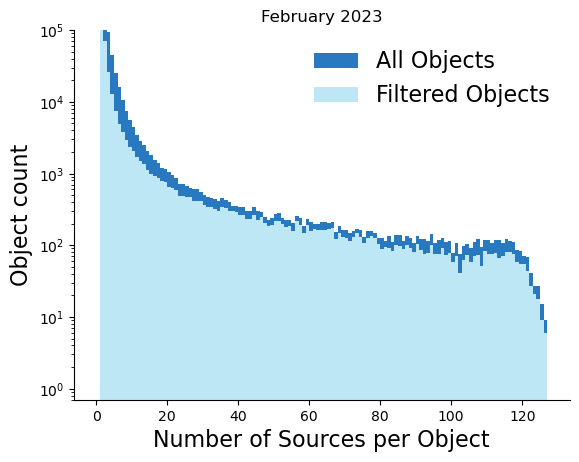

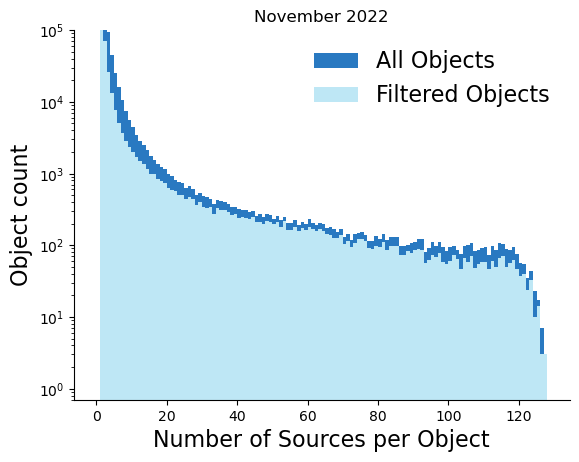

In [21]:
plac.plotDiaObjectHistogram(objTable, goodObj, title=f'{month} {year}');
plac.plotDiaObjectHistogram(objTable_old, goodObj_old, title=f'{month_old} {year_old}');

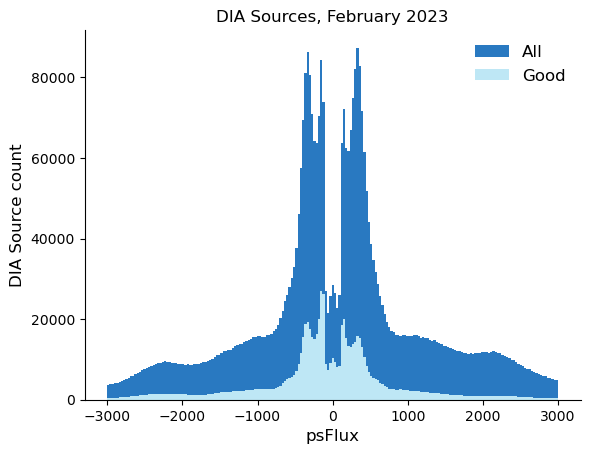

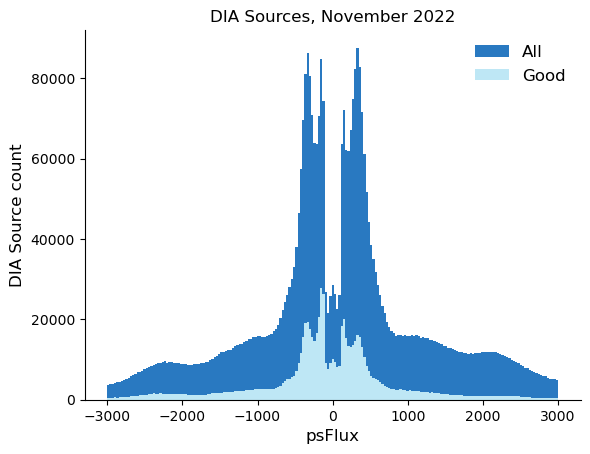

In [22]:
plac.plotFluxHistSrc(srcTable, goodSrc, fluxType='psFlux', label1='All', label2='Good',
                title=f'DIA Sources, {month} {year}')
plac.plotFluxHistSrc(srcTable_old, goodSrc_old, fluxType='psFlux', label1='All', label2='Good',
                title=f'DIA Sources, {month_old} {year_old}')

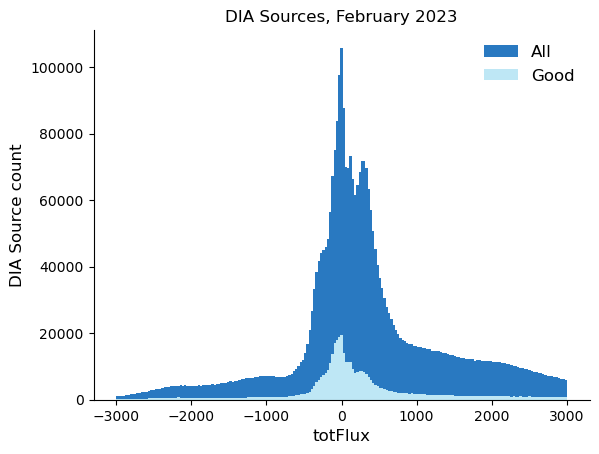

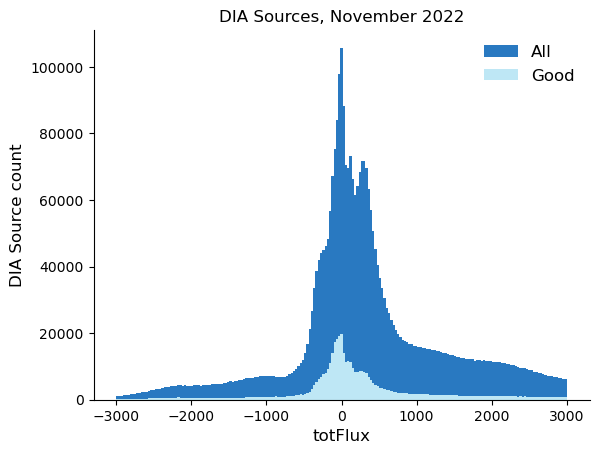

In [23]:
plac.plotFluxHistSrc(srcTable, goodSrc, fluxType='totFlux', label1='All', label2='Good',
                title=f'DIA Sources, {month} {year}')
plac.plotFluxHistSrc(srcTable_old, goodSrc_old, fluxType='totFlux', label1='All', label2='Good',
                title=f'DIA Sources, {month_old} {year_old}')

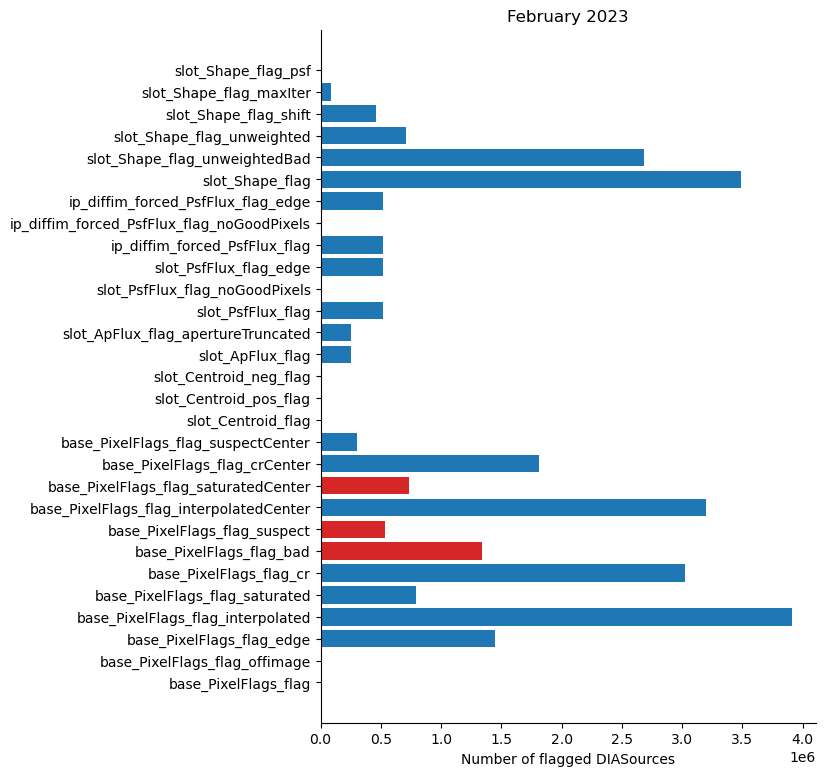

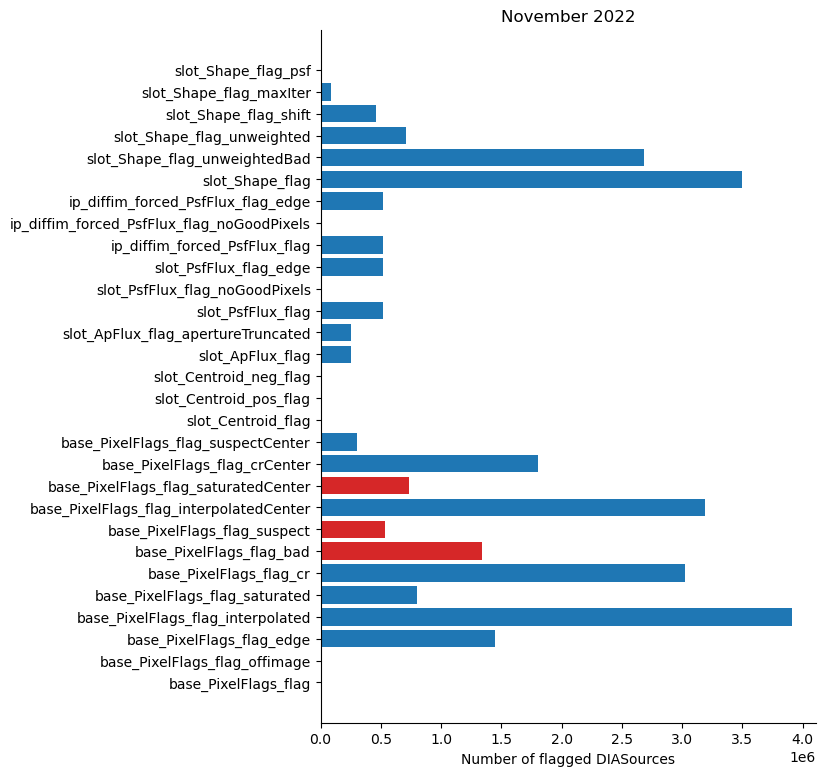

In [24]:
plac.plotFlagHist(srcTable, title=f'{month} {year}')
plac.plotFlagHist(srcTable_old, title=f'{month_old} {year_old}')

## 4. <a id="section_4">Separating the fake sources from the real sources</a>

The fakes are looking good, though the previous base run had issues with fakes. Will make note to be on the lookout for this in the future.

In [25]:
tractList = [9813]

In [ ]:
dfs = [butler.get('fakes_fakeSourceCat', collections=collections,
                 instrument=instrument, skymap=skymap, tract=tract) for tract in tractList]
allInjectedFakes = pd.concat(dfs, ignore_index=True)

In [ ]:
allInjectedFakes

,fakeId,dec,ra,isVisitSource,isTemplateSource,u_mag,g_mag,r_mag,i_mag,z_mag,y_mag,disk_semimajor,bulge_semimajor,disk_n,bulge_n,disk_axis_ratio,bulge_axis_ratio,disk_pa,bulge_pa,sourceType
0,11339921294723747657,0.030411,2.621597,True,False,25.160898,25.160898,25.160898,25.160898,25.160898,25.160898,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
1,13508594034953153567,0.034815,2.621040,True,False,20.642687,20.642687,20.642687,20.642687,20.642687,20.642687,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
2,10061695001111823235,0.042081,2.603423,True,False,23.876662,23.876662,23.876662,23.876662,23.876662,23.876662,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
3,10160649729451212320,0.040334,2.636729,True,False,25.118767,25.118767,25.118767,25.118767,25.118767,25.118767,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
4,11501236932388067930,0.033896,2.629257,True,False,23.367207,23.367207,23.367207,23.367207,23.367207,23.367207,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8858,12980162557453887505,0.043717,2.610436,False,True,20.013189,20.013189,20.013189,20.013189,20.013189,20.013189,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
8859,12557850712695415754,0.055644,2.621685,False,True,21.096544,21.096544,21.096544,21.096544,21.096544,21.096544,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
8860,10135486571415311965,0.040447,2.606848,False,True,24.345681,24.345681,24.345681,24.345681,24.345681,24.345681,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
8861,10909706008494998138,0.036272,2.603944,False,True,23.850171,23.850171,23.850171,23.850171,23.850171,23.850171,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star


In [ ]:
dfs_old = [butler.get('fakes_fakeSourceCat', collections=collections_old,
                 instrument=instrument, skymap=skymap, tract=tract) for tract in tractList]
allInjectedFakes_old = pd.concat(dfs, ignore_index=True)

In [ ]:
def collectMatchedDiaSources(fakesMatchDiaSrc, maxi=-1):
    """Given a butler query of fakesMatchDiaSrc datasetRefs, create a pandas dataframe with them all.
    'All' is defined as up to maxi of them, so it doesn't take forever.
    
    If you really want all of them, set maxi to -1.
    """
    #%%time
    visitDetectorFrames = []

    i = 0

    for datasetRef in fakesMatchDiaSrc: 
        try:
            frame = butler.getDirect(datasetRef)
            # nondetected sources don't have DIASource records--so propagate metadata to all rows
            # grab a detected row
            w = frame['diaSourceId'] > 0
            if np.sum(w) == 0:
                print(f'No real sources detected in {datasetRef}')
                continue
            ccdVisitId = int(frame.loc[w,'ccdVisitId'].iloc[0])
            filterName = frame.loc[w,'filterName'].iloc[0]
            # propagate to all rows
            frame.loc[:,'ccdVisitId'] = ccdVisitId 
            frame.loc[:,'filterName'] = filterName 
        except Exception as e:
            raise(e)
        else:
            visitDetectorFrames.append(frame)
        i+=1
        if i == maxi:
            break

    matchedDiaSources = pd.concat(visitDetectorFrames)

    matchedDiaSources.loc[:,'ra'] = np.degrees(matchedDiaSources['ra_x'])
    matchedDiaSources.loc[:,'decl'] = np.degrees(matchedDiaSources['dec'])

    return matchedDiaSources

In [ ]:
fakesMatchDiaSrc = butler.registry.queryDatasets(collections=collections,
                                                 datasetType='fakes_goodSeeingDiff_matchDiaSrc')
matchedDiaSources = collectMatchedDiaSources(fakesMatchDiaSrc)

No real sources detected in fakes_goodSeeingDiff_matchDiaSrc@{instrument: 'HSC', detector: 69, visit: 29340, ...}, sc=DataFrame] (id=dd1b32a0-6895-4d76-8a3e-ab5a64676667)


In [ ]:
fakesMatchDiaSrc_old = butler.registry.queryDatasets(collections=collections_old,
                                                 datasetType='fakes_goodSeeingDiff_matchDiaSrc')
matchedDiaSources_old = collectMatchedDiaSources(fakesMatchDiaSrc_old)

In [ ]:
instrumentDataId = butler.registry.expandDataId(instrument=instrument)
packer = butler.registry.dimensions.makePacker("visit_detector", instrumentDataId)
dataId = packer.unpack(matchedDiaSources.ccdVisitId)
matchedDiaSources['visit'] = dataId['visit']
matchedDiaSources['detector'] = dataId['detector']

In [ ]:
matchedDiaSources

,fakeId,dec,ra_x,isVisitSource,isTemplateSource,u_mag,g_mag,r_mag,i_mag,z_mag,...,totFluxErr,ixx,iyy,ixy,ixxPSF,iyyPSF,ixyPSF,ra,visit,detector
0,9925576755673734011,0.040570,2.618736,True,False,21.076858,21.076858,21.076858,21.076858,21.076858,...,287.172156,0.158463,0.152062,-0.005979,0.152134,-0.006806,-0.006806,150.042535,1876,58
1,11776664678093517971,0.040237,2.619725,True,False,21.871829,21.871829,21.871829,21.871829,21.871829,...,280.652148,0.155888,0.109388,-0.018608,0.152744,-0.006834,-0.006834,150.099198,1876,58
2,10488768092839019602,0.040364,2.618546,True,False,23.421855,23.421855,23.421855,23.421855,23.421855,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,150.031630,1876,58
3,9402229487954838548,0.041255,2.620385,True,False,20.519799,20.519799,20.519799,20.519799,20.519799,...,279.704889,0.159850,0.139002,-0.006697,0.152594,-0.006827,-0.006827,150.136998,1876,58
4,9853882797629003555,0.041307,2.618853,True,False,20.796279,20.796279,20.796279,20.796279,20.796279,...,284.383626,0.147495,0.114030,-0.013085,0.151914,-0.006796,-0.006796,150.049241,1876,58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25,11062481547915237310,0.036767,2.630567,False,True,20.516439,20.516439,20.516439,20.516439,20.516439,...,261.031586,NaN,NaN,NaN,0.109433,-0.007534,-0.007534,150.720406,11720,39
26,13717073645337856042,0.035555,2.630409,False,True,23.445505,23.445505,23.445505,23.445505,23.445505,...,261.982532,NaN,NaN,NaN,0.109361,-0.007529,-0.007529,150.711323,11720,39
27,10163715688547474798,0.036115,2.630954,False,True,24.380368,24.380368,24.380368,24.380368,24.380368,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,150.742579,11720,39
28,11864354834521175303,0.035731,2.628797,False,True,25.623689,25.623689,25.623689,25.623689,25.623689,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,150.618951,11720,39


In [ ]:
dataId_old = packer.unpack(matchedDiaSources_old.ccdVisitId)
matchedDiaSources_old['visit'] = dataId_old['visit']
matchedDiaSources_old['detector'] = dataId_old['detector']

Text(0.5, 1.0, 'DIA Objects, Fakes, and Matched DIA Sources, February 2023')

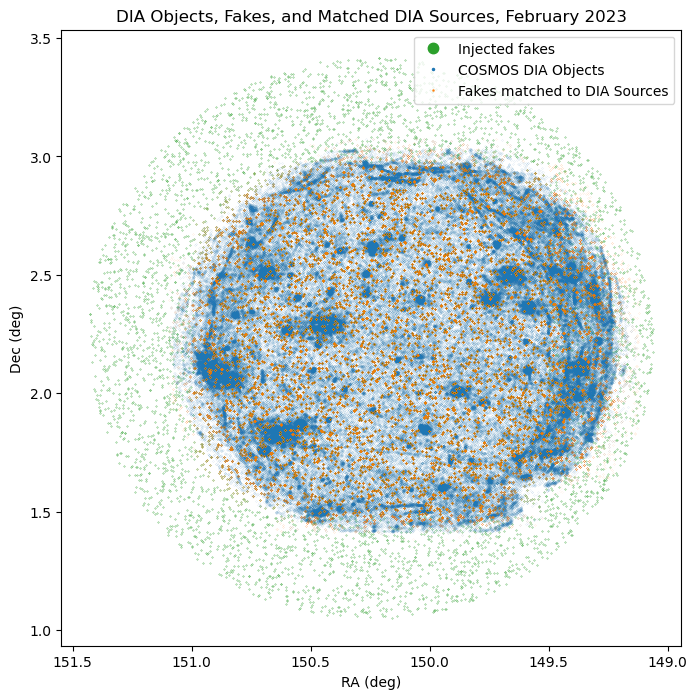

In [ ]:
plt.figure(figsize=(8,8))
plt.plot(allInjectedFakes.ra*u.rad.to(u.deg), allInjectedFakes.dec*u.rad.to(u.deg),
         ls='None', marker='.', ms=0.5, label="Injected fakes", color='C2')
plt.plot(goodObj.ra, goodObj.decl, ls='None', marker='.', ms=0.1, label="COSMOS DIA Objects", color='C0')
plt.plot(matchedDiaSources.ra_x*u.rad.to(u.deg), matchedDiaSources.dec*u.rad.to(u.deg), ls='None', marker='.',
         ms=0.05, label="Fakes matched to DIA Sources", color='C1')
plt.gca().invert_xaxis()
plt.xlabel("RA (deg)")
plt.ylabel("Dec (deg)")
plt.legend(markerscale=30)
plt.title(f'DIA Objects, Fakes, and Matched DIA Sources, {month} {year}')

In [ ]:
nFakesMatched = len(matchedDiaSources)
nFakesMatched_old = len(matchedDiaSources_old)

print(f"{month} {year}, Number of matched fake sources:", nFakesMatched)
print(f"{month_old} {year_old}, Number of matched fake sources:", nFakesMatched_old)

print("Diff: ", nFakesMatched-nFakesMatched_old)

February 2023, Number of matched fake sources: 471896
November 2022, Number of matched fake sources: 705
Diff:  471191


In [ ]:
nFakesDiff = len(srcTable) - nFakesMatched
nFakesDiff_old = len(srcTable_old) - nFakesMatched_old

print(f"{month} {year}, Number of non-fake DIA Sources: ", nFakesDiff)
print(f"{month_old} {year_old}, Number of non-fake DIA Sources: ", nFakesDiff_old)

print("Diff: ", nFakesDiff-nFakesDiff_old)

February 2023, Number of non-fake DIA Sources:  4530629
November 2022, Number of non-fake DIA Sources:  5007030
Diff:  -476401


visit 318: 18859 DIA Sources, 3621 matched injected fakes
visit 322: 22636 DIA Sources, 3598 matched injected fakes
visit 324: 19500 DIA Sources, 3592 matched injected fakes
visit 326: 19829 DIA Sources, 3568 matched injected fakes
visit 328: 21522 DIA Sources, 3561 matched injected fakes
visit 330: 20211 DIA Sources, 3536 matched injected fakes
visit 332: 18422 DIA Sources, 3556 matched injected fakes
visit 344: 19224 DIA Sources, 3593 matched injected fakes
visit 346: 20467 DIA Sources, 3556 matched injected fakes
visit 348: 22252 DIA Sources, 3625 matched injected fakes
visit 350: 20278 DIA Sources, 3601 matched injected fakes
visit 352: 20088 DIA Sources, 3605 matched injected fakes
visit 354: 20942 DIA Sources, 3653 matched injected fakes
visit 356: 20813 DIA Sources, 3588 matched injected fakes
visit 358: 19863 DIA Sources, 3585 matched injected fakes
visit 360: 19754 DIA Sources, 3574 matched injected fakes
visit 362: 20316 DIA Sources, 3580 matched injected fakes
visit 1166: 22

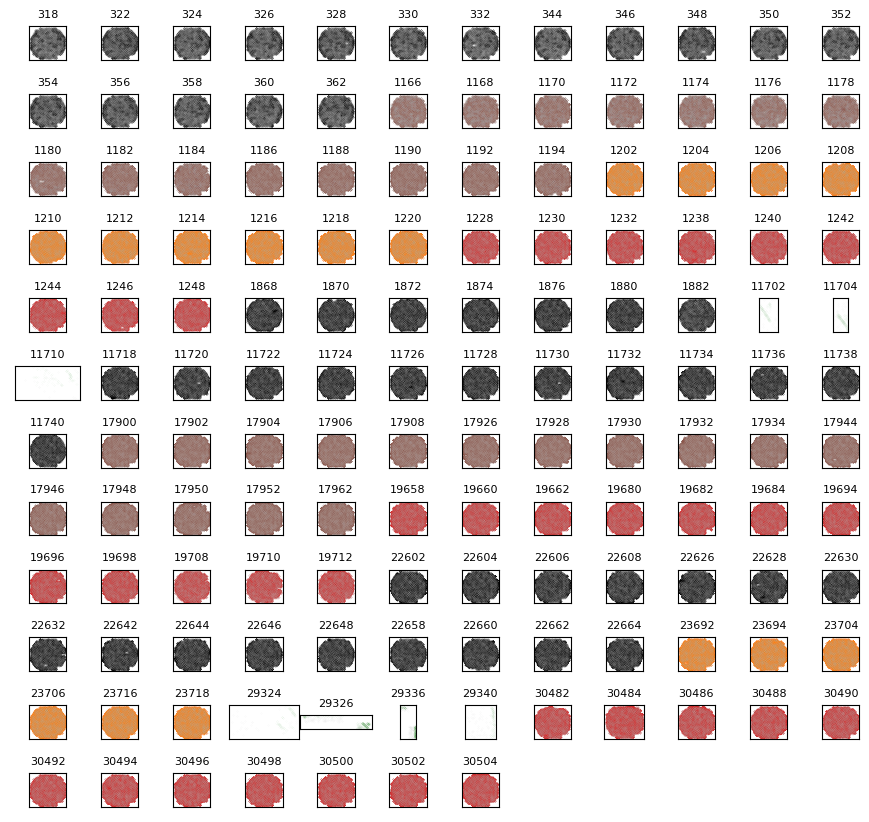

In [ ]:
# Plot visit-by-visit: DIA Sources (blue) and inserted fakes (orange)

sourceTablePlot = srcTable

visits = np.unique(sourceTablePlot['visit'])
nVisits = len(visits)
if np.floor(np.sqrt(nVisits)) - np.sqrt(nVisits) == 0:
    squareGridSize = int(np.sqrt(nVisits))
else:
    squareGridSize = int(np.sqrt(nVisits)) + 1

fig = plt.figure(figsize=(9, 9))
for count, visit in enumerate(np.unique(sourceTablePlot['visit'].values)):
    band = sourceTablePlot.loc[(sourceTablePlot.visit == visit), 'filterName'].iloc[0]
    color = [colorList[0] if band==bandList[0] else 
             colorList[1] if band==bandList[1] else 
             colorList[2] if band==bandList[2] else 
             colorList[3] if band==bandList[3] else 
             colorList[4] if band==bandList[4] else 
             colorList[5]]
    idx = sourceTablePlot.visit == visit
    ax = fig.add_subplot(squareGridSize, squareGridSize, count + 1, aspect='equal')
    ax.scatter(sourceTablePlot.ra[idx], sourceTablePlot.decl[idx], c=color, marker='.', s=0.005, alpha=0.3)
    
    fakeSources = matchedDiaSources.loc[matchedDiaSources.visit == visit]
    ax.scatter(fakeSources.ra_x*u.rad.to(u.deg), fakeSources.dec*u.rad.to(u.deg),
               c='0.75', marker='.', s=0.02, alpha=0.3)
    
    ax.set_title(visit, size=8)
    ax.invert_xaxis()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    print(f'visit {visit}: {len(sourceTablePlot.loc[sourceTablePlot.visit == visit])} DIA Sources, {len(fakeSources)} matched injected fakes')

fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.subplots_adjust(wspace=0)

Text(0.5, 1.0, 'Stacked Visits, February 2023')

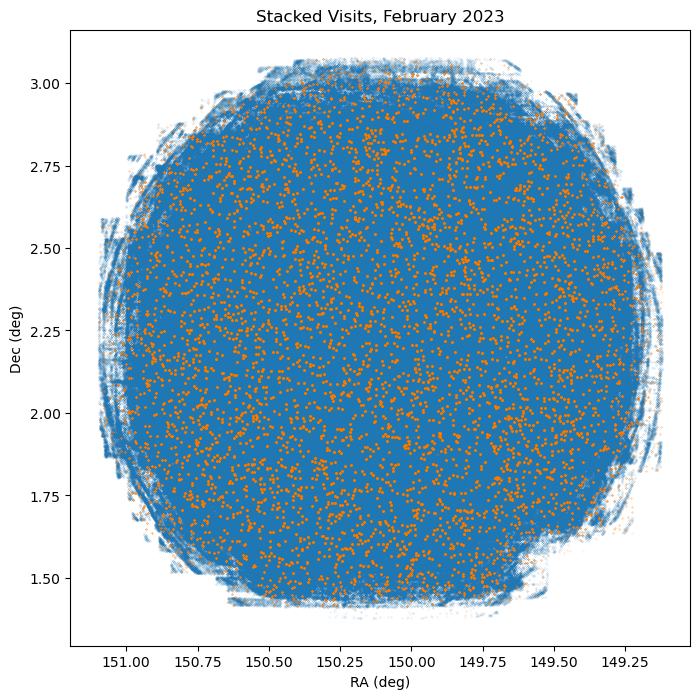

In [ ]:
# Same as above but all on top of each other instead of broken out by visit
plt.figure(figsize=(8, 8))
plt.scatter(srcTable['ra'], srcTable['decl'],c='C0', s=0.01, alpha=0.5, label="COSMOS DIA Objects")
plt.scatter(matchedDiaSources.ra_x*u.rad.to(u.deg), matchedDiaSources.dec*u.rad.to(u.deg), c='C1', s=0.05, alpha=0.5, label="Fakes matched to DIA Sources")
plt.gca().invert_xaxis()
plt.xlabel('RA (deg)')
plt.ylabel('Dec (deg)')
plt.title(f'Stacked Visits, {month} {year}')

## 5. <a id="section_5">Fakes completeness analysis</a>

All plots are much better than the previous run. Spatial distribution is now evenly distributed through the plot. The completeness plots are as expected. The current run is consistent with the October 2022 run.

In [ ]:
def completenessByBandPlot(matchedDiaSources, bandList, colorList, flux_col_suffix='_mag', doRaDecCut=False):

    completeness_byband = {}
    completeness_err_byband = {}
    bins = np.linspace(20, 26, 70)
    
    # Some filters
    wScienceOnly = matchedDiaSources['isVisitSource'] & ~matchedDiaSources['isTemplateSource']
    wMatched = matchedDiaSources['diaSourceId'] > 0
    
    if doRaDecCut:
        # Spatial cut  # probably redundant now that we do RA/Dec cut in trimFakes
        minra = matchedDiaSources.loc[wScienceOnly & wMatched,'ra'].min()
        maxra = matchedDiaSources.loc[wScienceOnly & wMatched,'ra'].max()
        mindecl = matchedDiaSources.loc[wScienceOnly & wMatched,'decl'].min()
        maxdecl = matchedDiaSources.loc[wScienceOnly & wMatched,'decl'].max()
        wRADec = (matchedDiaSources.ra < maxra) & (matchedDiaSources.ra > minra) & \
                 (matchedDiaSources.decl > mindecl) & (matchedDiaSources.decl < maxdecl)

    for band in bandList:
        wband = matchedDiaSources['filterName'] == band

        if doRaDecCut:
            matched_filter = (wMatched & wScienceOnly & wRADec & wband)
            unmatched_filter = (~wMatched & wScienceOnly & wRADec & wband)
        else:
            matched_filter = (wMatched & wScienceOnly &  wband)
            unmatched_filter = (~wMatched & wScienceOnly & wband)

        n_matched, edges = np.histogram(matchedDiaSources.loc[matched_filter, f'{band}{flux_col_suffix}'], bins=bins)
        n_unmatched, edges = np.histogram(matchedDiaSources.loc[unmatched_filter, f'{band}{flux_col_suffix}'], bins=bins)

        ntot = n_matched + n_unmatched
        nmatched_err = np.sqrt(n_matched)
        completeness_byband[band] = n_matched/ntot

        # Attempt to compute some kind of error
        ntot_err = np.sqrt(ntot) # compute on total to keep Poisson errors in gaussian regime
        completeness_err_byband[band] = completeness_byband[band] * \
                                        np.sqrt((nmatched_err/n_matched)**2. + (ntot_err/ntot)**2.)
    
    plt.figure()
    plt.title('Spatial distribution of matched DIA Sources')
    plt.scatter(matchedDiaSources.loc[wScienceOnly & wMatched,'ra'], \
                matchedDiaSources.loc[wScienceOnly & wMatched,'decl'],
                marker='x', s=3, label='Matched science fake')
    plt.scatter(matchedDiaSources.loc[wScienceOnly & ~wMatched,'ra'], \
                matchedDiaSources.loc[wScienceOnly & ~wMatched,'decl'],
                marker='.', s=3, label='Unmatched science fake')
    plt.legend()
    
    if len(bandList) > 1:
        fig, axs = plt.subplots(3, 2, figsize=(9, 12))
        axG = axs[0, 0]
        axR = axs[0, 1]
        axI = axs[1, 0]
        axZ = axs[1, 1]
        axY = axs[2, 0]
        #axHits = axs[2, 1]
        ax0 = axs[2, 1]
        ax0.axis('off')
        axList = [axG, axR, axI, axZ, axY]
        colorList = ['C2', 'C1', 'C3', 'C5', 'k']
        xlim = (20,26)
        ylim = (0, 1)
        plt.setp(axs, xlim=xlim, ylim=ylim)
        fig.suptitle(f'Completeness')
        for ax, band, color in zip(axList, bandList, colorList):
            ax.errorbar(bins[0:-1], completeness_byband[band], completeness_err_byband[band], color=color)
    
    plt.figure(figsize=(8, 6))
    for band, color in zip(bandList, colorList):
        plt.errorbar(bins[0:-1], completeness_byband[band], completeness_err_byband[band], color=color, label=band)
    plt.axhline(.9, ls='--', color='0.75')#, label='90%')
    plt.legend(loc='lower left')
    plt.xlabel('Injected magnitude')
    plt.ylabel('Fractional completeness')
    plt.title('Completeness for sources injected into science (visit) images')

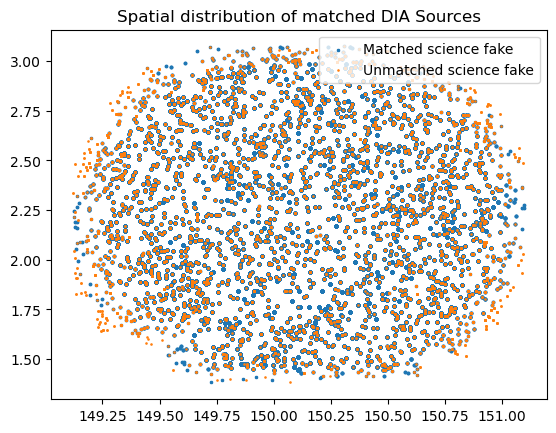

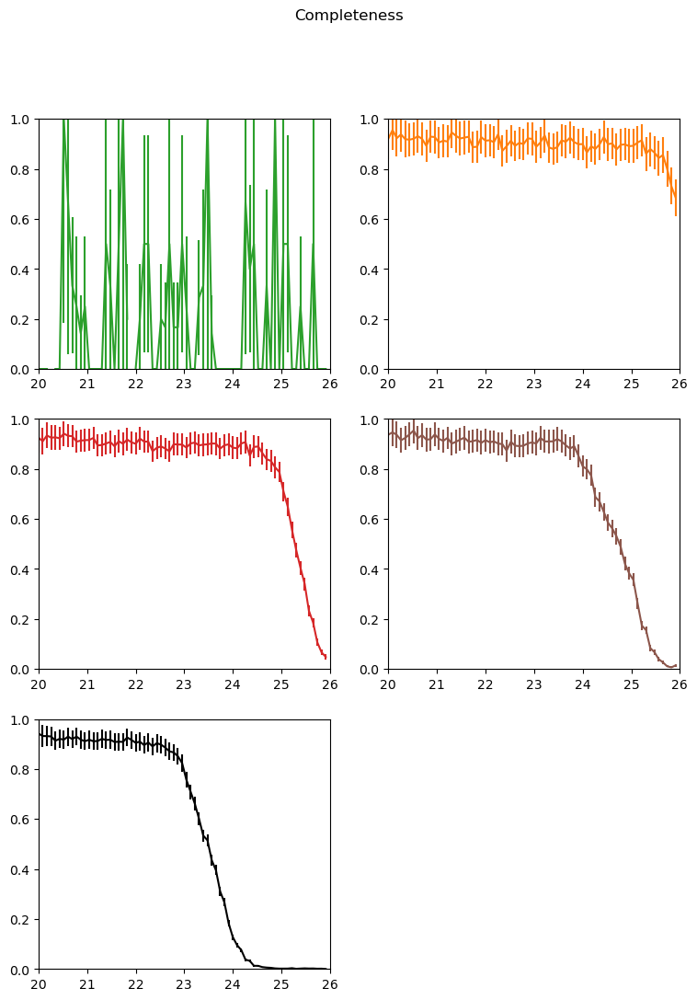

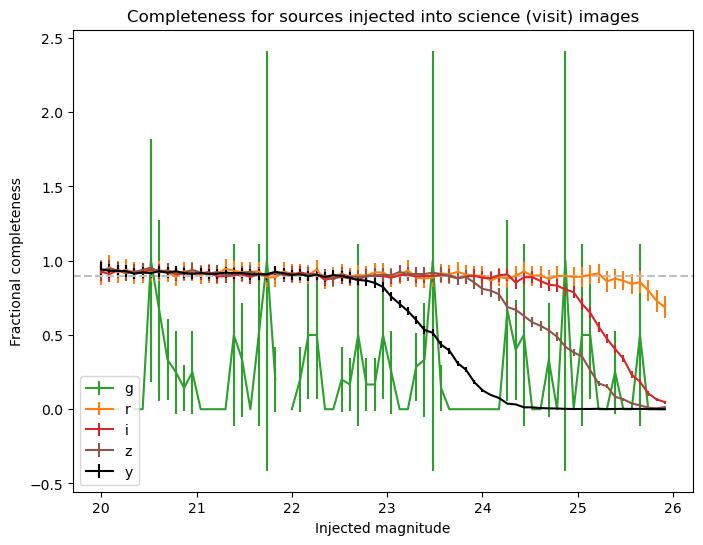

In [ ]:
completenessByBandPlot(matchedDiaSources, bandList, colorList,
                       flux_col_suffix='_mag', doRaDecCut=False)

## 6. <a id="section_6">Calexp and PSF analysis</a>

Plots are consistent with previous run. Accepted and rejected PSF sources are evenly distributed.

In [ ]:
visits = [29350]
detectors = [49]

Collection:  u/elhoward/DM-37695/HSC-fakes , Visit:  29350 , Detector:  49


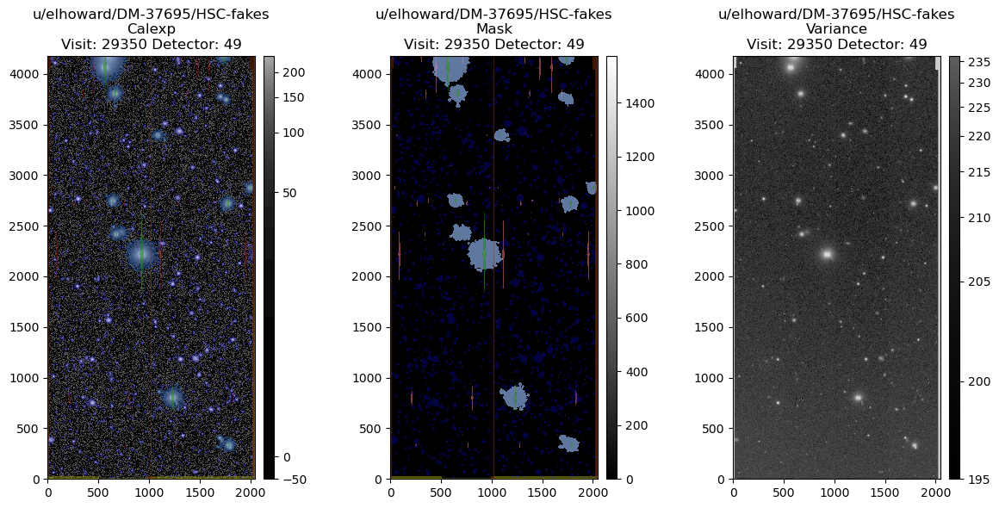

Collection:  u/elhoward/DM-35285/hsc-output-collection , Visit:  29350 , Detector:  49


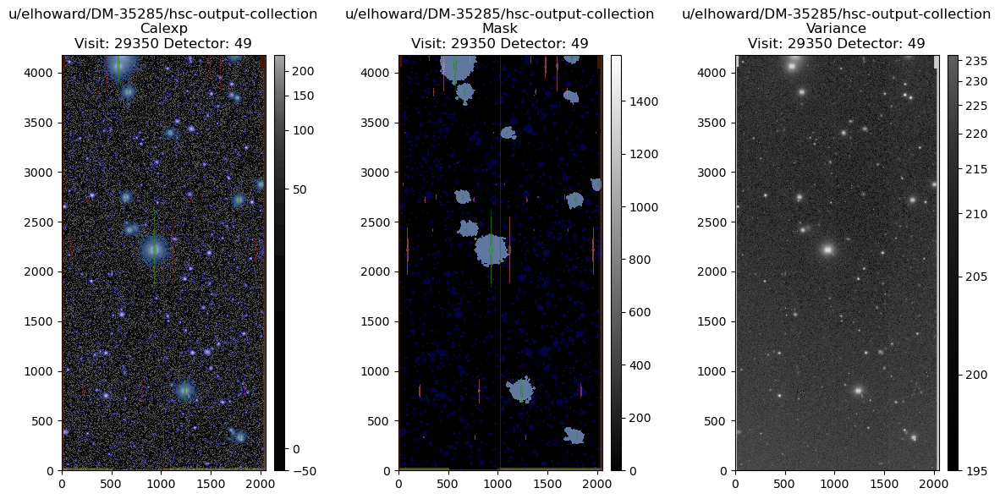

In [ ]:
for collection in collectionsList:
    for visit in visits:
        for detector in detectors:
            print('Collection: ', collection,
                  ', Visit: ', visit,
                  ', Detector: ', detector)
            afwDisplay.setDefaultBackend('matplotlib') 

            calexp = butler.get('calexp', instrument='HSC',
                                visit=visit, detector=detector, collections=collection)
            fig, (ax1,ax2,ax3) = plt.subplots(1, 3, figsize=(12, 6))

            plt.sca(ax1)  # set the first axis as current
            display1 = afwDisplay.Display(frame=fig)
            display1.scale('asinh', -1, 30)
            display1.mtv(calexp, f'{collection}\nCalexp\nVisit: {visit} Detector: {detector}')

            plt.sca(ax2)  # set the second axis as current
            display2 = afwDisplay.Display(frame=fig)
            display2.mtv(calexp.mask, f'{collection}\nMask\nVisit: {visit} Detector: {detector}')

            plt.sca(ax3) # set the third axis as current
            display3 = afwDisplay.Display(frame=fig)
            display3.scale('asinh', 'zscale')
            display3.mtv(calexp.variance, f'{collection}\nVariance\nVisit: {visit} Detector: {detector}')

            plt.tight_layout()
            plt.show()
            plt.close(fig)

Visit:  29350 , Detector:  49


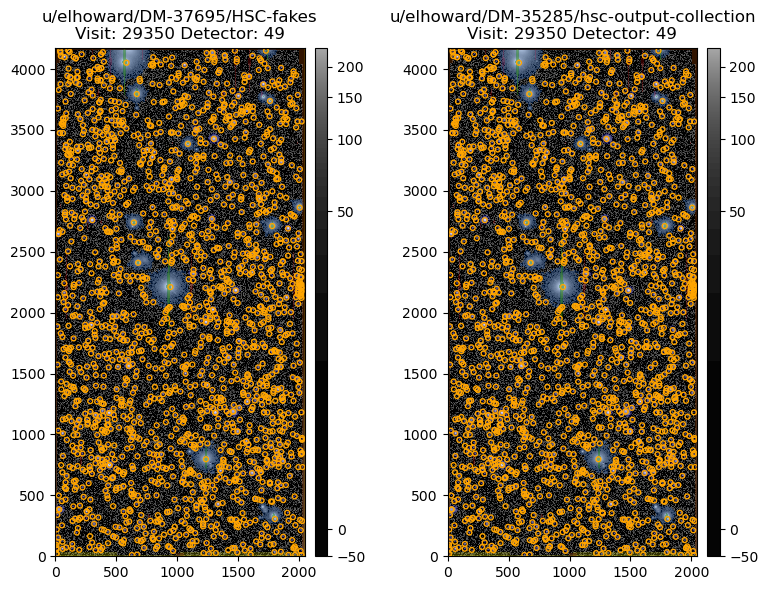

In [ ]:
for visit in visits:
    for detector in detectors:
        print('Visit: ', visit, ', Detector: ', detector)
        afwDisplay.setDefaultBackend('matplotlib') 

        fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(8, 6))

        plt.sca(ax1)  # set the first axis as current
        calexp1 = butler.get('calexp', instrument=instrument,
                        visit=visit, detector=detector, collections=collections)
        display1 = afwDisplay.Display(frame=fig)
        display1.setMaskTransparency(80)
        display1.scale('asinh', -1, 30)
        display1.mtv(calexp1, f'{collections}\nVisit: {visit} Detector: {detector}')
        src1 = butler.get('src', instrument=instrument,
                          visit=visit, detector=detector, collections=collections)
        with display1.Buffering():
            for record in src1:
                display1.dot('o', record.getX(), record.getY(), size=20, ctype='orange')

        plt.sca(ax2)  # set the second axis as current
        calexp2 = butler.get('calexp', instrument=instrument,
                        visit=visit, detector=detector, collections=collections_old)
        display2 = afwDisplay.Display(frame=fig)
        display2.setMaskTransparency(80)
        display2.scale('asinh', -1, 30)
        display2.mtv(calexp2, f'{collections_old}\nVisit: {visit} Detector: {detector}')
        src2 = butler.get('src', instrument=instrument,
                          visit=visit, detector=detector, collections=collections_old)
        with display2.Buffering():
            for record in src2:
                display2.dot('o', record.getX(), record.getY(), size=20, ctype='orange')
        plt.tight_layout()
        plt.show()
        plt.close(fig)

Collection:  u/elhoward/DM-37695/HSC-fakes , Visit:  29350 , Detector:  49
Accepted PSF Sources (green):  40  Rejected PSF Sources (red):  20


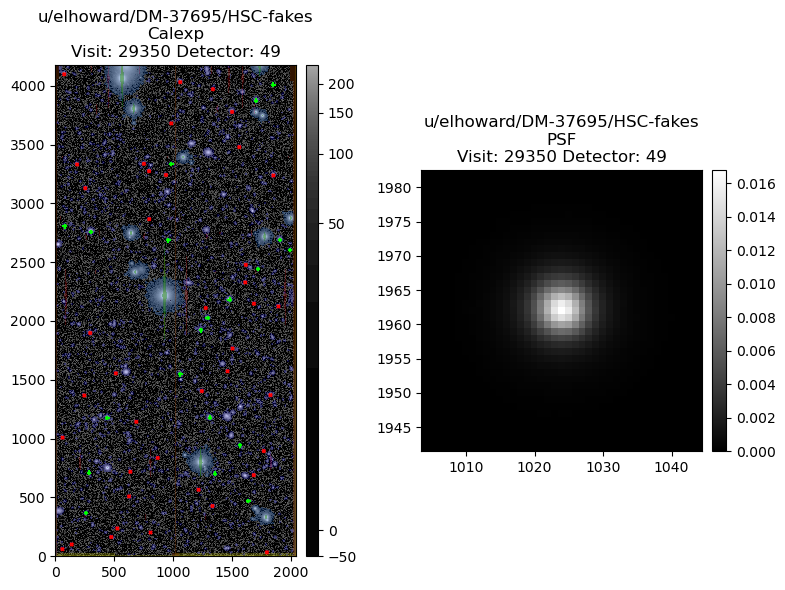

Collection:  u/elhoward/DM-35285/hsc-output-collection , Visit:  29350 , Detector:  49
Accepted PSF Sources (green):  40  Rejected PSF Sources (red):  20


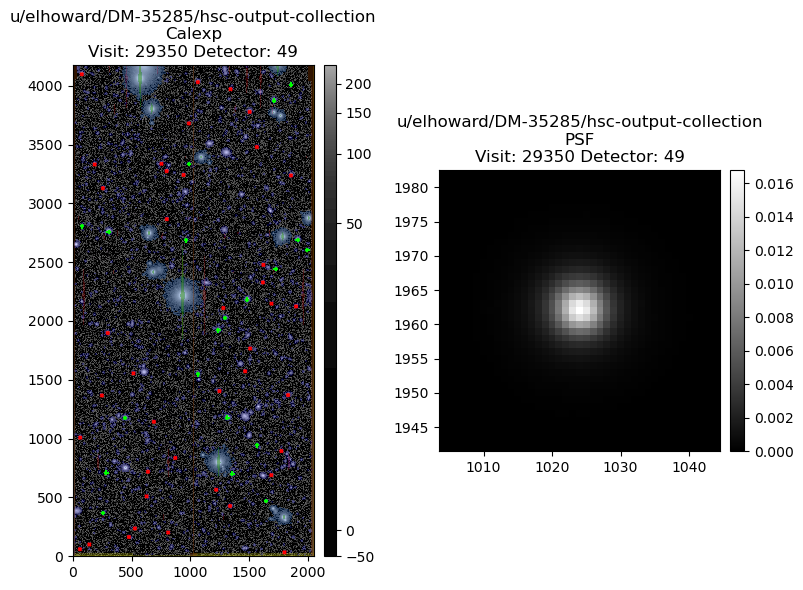

In [ ]:
for collection in collectionsList:
    for visit in visits:
        for detector in detectors:
            print('Collection: ', collection,
                  ', Visit: ', calexp.visitInfo.getId(),
                  ', Detector: ', calexp.detector.getId())
            
            afwDisplay.setDefaultBackend('matplotlib') 
            fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(8, 6))
            
            plt.sca(ax1)  # set the first axis as current
            calexp = butler.get('calexp', instrument=instrument,
                                visit=visit, detector=detector, collections=collection)
            display1 = afwDisplay.Display(frame=fig)
            display1.setMaskTransparency(80)
            display1.scale('asinh', -1, 30)
            display1.mtv(calexp, f'{collection}\nCalexp\nVisit: {visit} Detector: {detector}')
            src = butler.get('src', instrument=instrument,
                             visit=visit, detector=detector, collections=collection)
            acceptedPsfSources = src[src['calib_psf_used']]
            rejectedPsfSources = src[src['calib_psf_candidate'] &
                                 (src['calib_psf_used'] == False)]
            print('Accepted PSF Sources (green): ', len(acceptedPsfSources),
                  ' Rejected PSF Sources (red): ', len(rejectedPsfSources))
            with display1.Buffering():
                for s in src[src['calib_psf_used']]:
                    display1.dot("x", s.getX(), s.getY(), size=10, ctype='red')
            with display1.Buffering():
                for s in rejectedPsfSources:
                    display1.dot("+", s.getX(), s.getY(), size=10, ctype='green')

            plt.sca(ax2)  # set the second axis as current
            psf = calexp.getPsf()
            position = psf.getAveragePosition()
            display2 = afwDisplay.Display(frame=fig)
            display2.mtv(psf.computeImage(position), f'{collection}\nPSF\nVisit: {visit} Detector: {detector}')
            
            plt.tight_layout()
            plt.show()
            plt.close(fig)

## 7. <a id="section_7">SNR distributions</a>

SNR distribution is consistent with previous run. Still have some outliers.

(0.0, 10000.0)

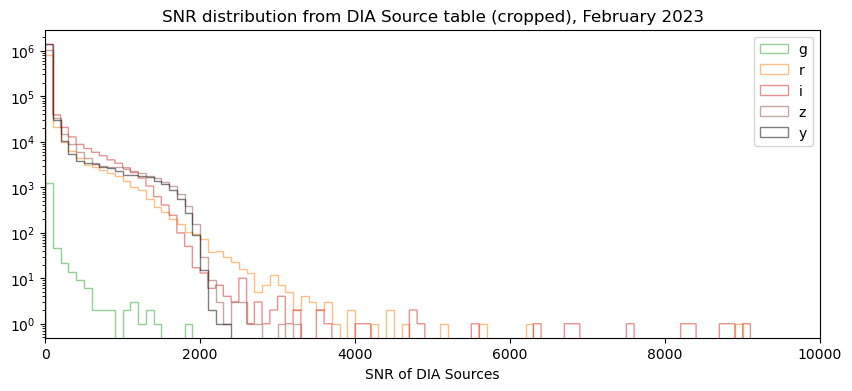

In [ ]:
binwidth=100

plt.figure(figsize=(10,4))
plt.yscale('log')
for band, color in zip(bandList, colorList):
    data = srcTable.loc[srcTable.filterName==band, 'snr']
    snrHist = plt.hist(data, bins=range(0, int(max(data)) + binwidth, binwidth), color=color, alpha=0.5, label=band, histtype='step')
plt.legend()
plt.title(f'SNR distribution from DIA Source table (cropped), {month} {year}')
plt.xlabel('SNR of DIA Sources')
plt.gca().set_xlim(0, 10000)

Text(0.5, 0, 'SNR of DIA Sources')

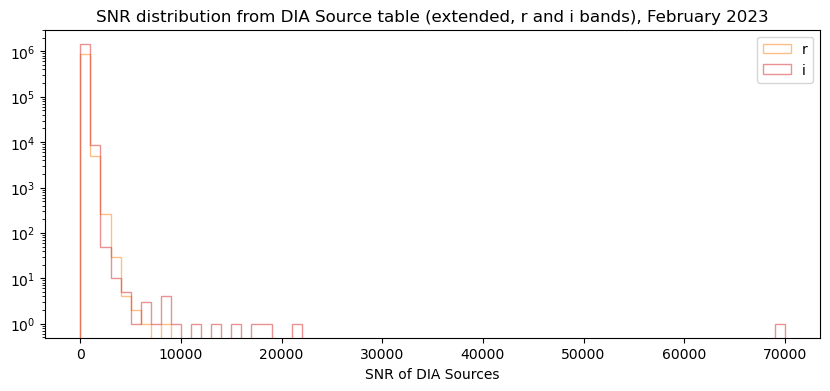

In [ ]:
binwidth = 1000

plt.figure(figsize=(10,4))
plt.yscale('log')
for band, color in zip(bandList[1:3], colorList[1:3]):
    data = srcTable.loc[srcTable.filterName==band, 'snr']
    snrHist = plt.hist(data, bins=range(0, int(max(data)) + binwidth, binwidth), color=color, alpha=0.5, label=band, histtype='step')
plt.legend()
plt.title(f'SNR distribution from DIA Source table (extended, r and i bands), {month} {year}')
plt.xlabel('SNR of DIA Sources')

In [ ]:
# Pre-snr column:
srcTable['psFluxSNR'] = srcTable.psFlux / srcTable.psFluxErr
srcTable['totFluxSNR'] = srcTable.totFlux / srcTable.totFluxErr

Text(0.5, 0, 'psFlux/psFluxErr')

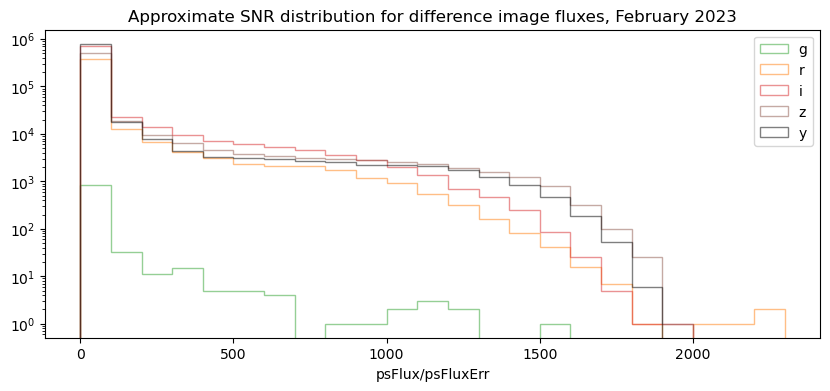

In [ ]:
binwidth=100

plt.figure(figsize=(10,4))
plt.yscale('log')
for band, color in zip(bandList, colorList):
    data = srcTable.loc[srcTable.filterName==band, 'psFluxSNR']
    psFluxHist = plt.hist(data, bins=range(0, int(max(data)) + binwidth, binwidth), color=color, alpha=0.5, label=band, histtype='step')
plt.legend()
plt.title(f'Approximate SNR distribution for difference image fluxes, {month} {year}')
plt.xlabel('psFlux/psFluxErr')

Text(0.5, 0, 'totFlux/totFluxErr')

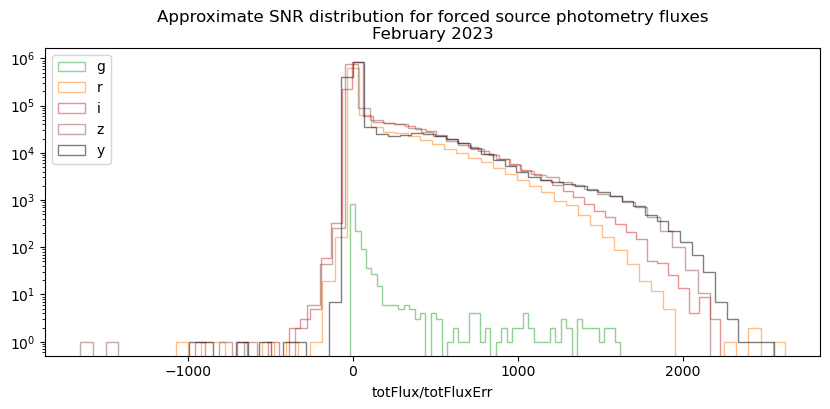

In [ ]:
plt.figure(figsize=(10,4))
plt.yscale('log')
for band, color in zip(bandList, colorList):
    totFluxHist = plt.hist(srcTable.loc[srcTable.filterName==band, 'totFluxSNR'], bins=50, color=color, alpha=0.5, label=band, histtype='step')
plt.legend()
plt.title(f'Approximate SNR distribution for forced source photometry fluxes\n{month} {year}')
plt.xlabel('totFlux/totFluxErr')